# Figures & Tables

In [1]:
import os
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import iris
from iris import plot
import xarray as xr
import cf_units
import cftime
import cartopy
import cartopy.crs as ccrs
import geopandas as gpd
import warnings
import pandas as pd
import pickle
from copy import deepcopy
from scipy import stats
from scipy.signal import periodogram
from scipy.stats import pearsonr
import random
from Functions import *
from Global_Variables import *

In [2]:
obs_df = pd.read_pickle(os.path.join(RESULTS_PATH, 'AR6_obs_df.pkl'))
obsclim_df = pd.read_pickle(os.path.join(RESULTS_PATH, 'AR6_obsclim_df.pkl'))
counterclim_df = pd.read_pickle(os.path.join(RESULTS_PATH, 'AR6_counterclim_df.pkl'))
model_weights = pd.read_pickle(os.path.join(RESULTS_PATH, 'NME3_Weights.pkl'))

INPUT_PATH = os.path.join(DATA_PATH, 'ISIMIP', 'ISIMIP3a', 'InputData', '')

## Figures

### Main Figures

#### Figure 1

##### Generate the underlying data

###### Fig. 1a

In [9]:
warnings.simplefilter(action="ignore", category=DeprecationWarning)

Generate the values for the _Factual_ PDF of Figure 1a.<br>
First calculate the relative anomaly for the factual present-day simulations.<br>
Then draw 100 000 times from these relative anomalies based on the global model weights.<br>

Lastly, we'll replace inf values by nans (these occur when there is no burned area in the counterfactual, so we divide by 0. This only occurs in some months of the ARP (Arabian Peninsula) region in one model (ORCHIDEE)).<br>
And we drop the nans.

In [10]:
obsclim = constrain_time(to_global(obsclim_df), 2003, 2019)
counterclim = constrain_time(to_global(counterclim_df), 2003, 2019)
df = (obsclim-counterclim.mean(axis=0))/counterclim.mean(axis=0)

series = pd.Series(df.values.ravel())
obsclim_pd_sampled_global = series.sample(n=100000, weights=np.tile(select_region(model_weights, 'Global').values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True)

Similar as above, but now for the _Counterfactual_ present-day PDF of Fig. 1a.

In [11]:
counterclim = constrain_time(to_global(counterclim_df), 2003, 2019)
df = (counterclim-counterclim.mean(axis=0))/counterclim.mean(axis=0)

series = pd.Series(df.values.ravel())
counterclim_pd_sampled_global = series.sample(n=100000, weights=np.tile(select_region(model_weights, 'Global').values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True)

Calculate the difference in mean burned area between the two distributions (in %).

In [12]:
global_cc_difference = (obsclim_pd_sampled_global.mean() - counterclim_pd_sampled_global.mean()) * 100
print(f'Climate change is causing a global increase in burned area of {global_cc_difference.round(0).astype(int)}%.')

Climate change is causing a global increase in burned area of 16%.


###### Fig. 1b

Same as Fig. 1a but now for each region instead of globally

Factual present-day

In [13]:
obsclim = constrain_time(obsclim_df, 2003, 2019) # Select the factual present-day
counterclim = constrain_time(counterclim_df, 2003, 2019) # Select the counterfactual present-day
df = (obsclim-counterclim.mean(axis=0))/counterclim.mean(axis=0) # Calculate the factual present-day relative anomaly

obsclim_pd_sampled_regional = pd.DataFrame(index=np.arange(100000), columns=df.columns.unique(level='Region')) # Cretae an empty dataframe for the 100 000 draws for the PDF

for regionname in df.columns.unique(level='Region'):
    region_series = pd.Series(df.loc[slice(None), regionname].values.ravel())
    obsclim_pd_sampled_regional.loc[slice(None), regionname] = region_series.sample(n=100000, weights=np.tile(select_region(model_weights, regionname).values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True).values

obsclim_pd_sampled_regional.replace([np.inf, -np.inf], np.nan, inplace=True)
obsclim_pd_sampled_regional.dropna(inplace=True)

Counterfactual present-day

In [14]:
counterclim = constrain_time(counterclim_df, 2003, 2019)
df = (counterclim-counterclim.mean(axis=0))/counterclim.mean(axis=0)

counterclim_pd_sampled_regional = pd.DataFrame(index=np.arange(100000), columns=df.columns.unique(level='Region'))

for regionname in df.columns.unique(level='Region'):
    region_series = pd.Series(df.loc[slice(None), regionname].values.ravel())
    counterclim_pd_sampled_regional.loc[slice(None), regionname] = region_series.sample(n=100000, weights=np.tile(select_region(model_weights, regionname).values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True).values
    
counterclim_pd_sampled_regional.replace([np.inf, -np.inf], np.nan, inplace=True)
counterclim_pd_sampled_regional.dropna(inplace=True)

Calculate the difference in mean between the two (in %) for each of the AR6 regions

In [15]:
regional_fact_vs_cfact = (obsclim_pd_sampled_regional.mean(axis=0) - counterclim_pd_sampled_regional.mean(axis=0)) * 100
regional_fact_vs_cfact.head()

Region
NWN    -2.829484
NEN    -3.642556
WNA    32.895844
CNA    11.706331
ENA     7.065483
dtype: float32

###### Fig. 1c

Very similar to the two global PDF generating cells of Fig. 1a, but for the present-day counterfactual PDF of Fig. 1c

In [16]:
counterclim_global = to_global(counterclim_df)

counterclim_early = constrain_time(counterclim_global, 1900, 1920)
counterclim_pd = constrain_time(counterclim_global, 2003, 2019)

df = (counterclim_pd-counterclim_early.mean(axis=0))/counterclim_early.mean(axis=0)

series = pd.Series(df.values.ravel())
counterclim_dhf_sampled_global = series.sample(n=100000, weights=np.tile(select_region(model_weights, 'Global').values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True)

Early industrial counterfactual PDF of Fig. 1c

In [17]:
counterclim_early = constrain_time(to_global(counterclim_df), 1900, 1920)
df = (counterclim_early-counterclim_early.mean(axis=0))/counterclim_early.mean(axis=0)

series = pd.Series(df.values.ravel())
counterclim_early_sampled_global = series.sample(n=100000, weights=np.tile(select_region(model_weights, 'Global').values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True)

Calculate the difference in mean burned area between the two distributions (in %).

In [18]:
global_dhf_difference = ((counterclim_dhf_sampled_global.mean() - counterclim_early_sampled_global.mean()) * 100)
print(f'DHF are causing a global decrease in burned area of {-global_dhf_difference.round(0).astype(int)}%.') 
# I added an extra minus to the result so the '-16% increase' can be expressed as a 16% decrease.

DHF are causing a global decrease in burned area of 16%.


###### Fig. 1d

Same as Fig. 1c but now for each region instead of globally

Present-day counterfactual

In [19]:
counterclim_early = constrain_time(counterclim_df, 1900, 1920)
counterclim_pd = constrain_time(counterclim_df, 2003, 2019)

df = (counterclim_pd-counterclim_early.mean(axis=0))/counterclim_early.mean(axis=0)

counterclim_pd_vs_early_sampled_regional = pd.DataFrame(index=np.arange(100000), columns=df.columns.unique(level='Region'))

for regionname in df.columns.unique(level='Region'):
    region_series = pd.Series(df.loc[slice(None), regionname].values.ravel())
    counterclim_pd_vs_early_sampled_regional.loc[slice(None), regionname] = region_series.sample(n=100000, weights=np.tile(select_region(model_weights, regionname).values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True).values

counterclim_pd_vs_early_sampled_regional.replace([np.inf, -np.inf], np.nan, inplace=True)    
counterclim_pd_vs_early_sampled_regional.dropna(inplace=True)

Early industrial counterfactual

In [20]:
counterclim_early = constrain_time(counterclim_df, 1900, 1920)
df = (counterclim_early-counterclim_early.mean(axis=0))/counterclim_early.mean(axis=0)

counterclim_early_sampled_regional = pd.DataFrame(index=np.arange(100000), columns=df.columns.unique(level='Region'))

for regionname in df.columns.unique(level='Region'):
    region_series = pd.Series(df.loc[slice(None), regionname].values.ravel())
    counterclim_early_sampled_regional.loc[slice(None), regionname] = region_series.sample(n=100000, weights=np.tile(select_region(model_weights, regionname).values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True).values
    
counterclim_early_sampled_regional.replace([np.inf, -np.inf], np.nan, inplace=True)
counterclim_early_sampled_regional.dropna(inplace=True)

Calculate the difference in mean between the two (in %) for each of the AR6 regions

In [21]:
regional_pdcfact_vs_earlycfact = (counterclim_pd_vs_early_sampled_regional.mean(axis=0) - counterclim_early_sampled_regional.mean(axis=0))*100
regional_pdcfact_vs_earlycfact.head()

Region
NWN   -20.579271
NEN   -24.279076
WNA    40.117764
CNA    63.060635
ENA   -28.906704
dtype: float32

In [26]:
df = (obsclim-counterclim_early.mean(axis=0))/counterclim_early.mean(axis=0)
series = pd.Series(df.values.ravel())
obsclim_all_global_sampled = series.sample(n=100000, weights=np.tile(select_region(model_weights, 'Global').values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True)

Region           NWN                                                       \
Model        CLASSIC     JULES LPJ-GUESS-SIMFIRE-BLAZE LPJ-GUESS-SPITFIRE   
Date                                                                        
1901-01-01  0.000000  0.018138                0.007814           0.096762   
1901-02-01  0.000000  0.022766                0.000000           0.081154   
1901-03-01  0.000000  0.029003                0.000000           0.074831   
1901-04-01  0.000222  0.040793                0.013041           0.083862   
1901-05-01  0.015360  0.094010                0.056918           0.276441   
...              ...       ...                     ...                ...   
1920-08-01  1.151155  0.554463                0.519420           0.874994   
1920-09-01  0.180346  0.110173                0.089345           0.088810   
1920-10-01  0.022512  0.046783                0.006084           0.014732   
1920-11-01  0.001303  0.027606                0.003135           0.009474   
1920-12-01  0.000000  0.020694                0.000000           0.009814   

Region                                                      NEN            \
Model      ORCHIDEE-MICT-SPITFIRE     SSiB4     VISIT   CLASSIC     JULES   
Date                                                                        
1901-01-01               0.000000  0.004292  1.336007  0.000000  0.008378   
1901-02-01               0.000000  0.004823  1.228198  0.000000  0.009142   
1901-03-01               0.000000  0.013974  1.400605  0.000000  0.012739   
1901-04-01               0.000000  0.249816  1.262898  0.000000  0.018988   
1901-05-01               0.328267  0.290838  0.807822  0.012332  0.063941   
...                           ...       ...       ...       ...       ...   
1920-08-01               1.862040  0.732778  1.715177  1.025159  0.360768   
1920-09-01               0.010513  0.198322  1.506430  0.093758  0.076743   
1920-10-01               0.000048  0.092664  1.622934  0.000181  0.029131   
1920-11-01               0.000000  0.011799  1.574403  0.000000  0.011412   
1920-12-01               0.000000  0.016932  1.641453  0.000000  0.009600   

Region                              ...                    SAU            \
Model      LPJ-GUESS-SIMFIRE-BLAZE  ... ORCHIDEE-MICT-SPITFIRE     SSiB4   
Date                                ...                                    
1901-01-01                0.000000  ...               2.653986  2.602621   
1901-02-01                0.000000  ...               2.165817  1.497285   
1901-03-01                0.000000  ...               1.089072  0.673039   
1901-04-01                0.022360  ...               0.237917  0.275580   
1901-05-01                0.076369  ...               0.168464  0.142347   
...                            ...  ...                    ...       ...   
1920-08-01                0.125912  ...               0.000109  0.010881   
1920-09-01                0.084567  ...               0.004996  0.083854   
1920-10-01                0.043257  ...               0.088816  0.295201   
1920-11-01                0.000000  ...               0.916035  1.152108   
1920-12-01                0.000000  ...               1.725052  1.790469   

Region                          NZ                                    \
Model          VISIT       CLASSIC     JULES LPJ-GUESS-SIMFIRE-BLAZE   
Date                                                                   
1901-01-01  1.714523  7.069977e-02  0.033729                0.245789   
1901-02-01  1.364342  1.157549e-02  0.035535                0.080924   
1901-03-01  1.625332  2.647587e-03  0.027462                0.031400   
1901-04-01  1.673846  7.214068e-07  0.020637                0.030055   
1901-05-01  1.703684  0.000000e+00  0.014953                0.005701   
...              ...           ...       ...                     ...   
1920-08-01  0.261841  0.000000e+00  0.009744                0.000634   
1920-09-01  0.253121  0.000000e+00  0.012873             

In [ ]:
global_ALL_difference = ((obsclim_all_sampled_global.mean() - counterclim_all_sampled_global.mean()) * 100)
print(f'ALL forcings are causing a global change in burned area of {global_all_difference.round(0).astype(int)}%.')


#For the PD regional hexagons
df = (obsclim-counterclim_early.mean(axis=0))/counterclim_early.mean(axis=0) # Calculate the factual present-day relative anomaly

obsclim_ALL_sampled_regional = pd.DataFrame(index=np.arange(100000), columns=df.columns.unique(level='Region')) # Cretae an empty dataframe for the 100 000 draws for the PDF

for regionname in df.columns.unique(level='Region'):
    region_series = pd.Series(df.loc[slice(None), regionname].values.ravel())
    obsclim_ALL_sampled_regional.loc[slice(None), regionname] = region_series.sample(n=100000, weights=np.tile(select_region(model_weights, regionname).values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True).values

obsclim_ALL_sampled_regional.replace([np.inf, -np.inf], np.nan, inplace=True)
obsclim_ALL_sampled_regional.dropna(inplace=True)


#For the early industrial regional hexagons
counterclim_early = constrain_time(counterclim_df, 1900, 1920)
df = (counterclim-counterclim.mean(axis=0))/counterclim.mean(axis=0)

counterclim_ALL_sampled_regional = pd.DataFrame(index=np.arange(100000), columns=df.columns.unique(level='Region'))

for regionname in df.columns.unique(level='Region'):
    region_series = pd.Series(df.loc[slice(None), regionname].values.ravel())
    counterclim_ALL_sampled_regional.loc[slice(None), regionname] = region_series.sample(n=100000, weights=np.tile(select_region(model_weights, regionname).values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True).values

counterclim_ALL_sampled_regional.replace([np.inf, -np.inf], np.nan, inplace=True)
counterclim_ALL_sampled_regional.dropna(inplace=True)



regional_pdfact_vs_earlycf = (obsclim_ALL_sampled_regional.mean(axis=0) - counterclim_ALL_sampled_regional.mean(axis=0)) * 100
regional_pdfact_vs_earlycf.head()

##### Create the Figure

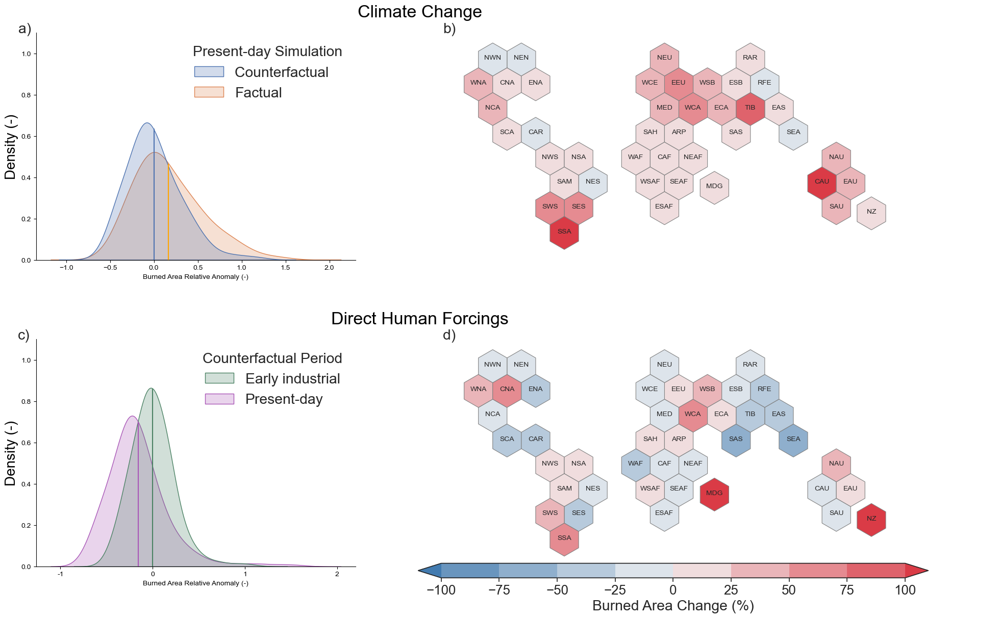

In [22]:
fig, axs = plt.subplots(3, 2, gridspec_kw={'width_ratios': [1, 2], 'height_ratios': [1, 0.35, 1], 'wspace': 0, 'hspace': 0}, figsize=(20, 12))
axs = axs.ravel()
sns.set_theme(style='white', font_scale=1.7)
warnings.simplefilter(action="ignore", category=UserWarning)

xlabel = 'Burned Area Relative Anomaly (-)'
bw_adjust = 4

boundaries = np.arange(-100, 101, 25)
n_colors = len(boundaries) + 1
cmap = sns.diverging_palette(245, 10, sep=1, n=n_colors)
cmap = mcolors.ListedColormap(cmap)
norm = mcolors.BoundaryNorm(boundaries=boundaries, ncolors=len(boundaries)+1, extend='both')
cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)


hexagons = gpd.read_file(os.path.join(SUPPLEMENTARY_DATA_PATH, 'ipcc-master', 'zones.gpkg')).rename(columns={'label': 'Region'})
hexagons = hexagons.set_index('Region')


# Figure 1a
ax = axs[0]
data = pd.concat([counterclim_pd_sampled_global, obsclim_pd_sampled_global], keys=['Counterfactual   ', 'Factual'], names=['Present-day Simulation'], axis=0).reset_index().drop('level_1', axis=1).rename(columns={0: xlabel})
sns.kdeplot(data, hue='Present-day Simulation', x=xlabel, fill=True, ax=ax, bw_adjust=bw_adjust)

ax.axvline(x=counterclim_pd_sampled_global.mean(), ymin=0, ymax=0.575) #0.59
ax.axvline(x=obsclim_pd_sampled_global.mean(), ymin=0, ymax=0.42, c='orange')
ax.set_ylim([0, 1.1])
sns.despine(ax=ax)
sns.move_legend(ax, loc='upper right', frameon=False, fontsize='medium', title_fontsize='medium')
ax.text(s='a)', x=ax.viewLim.get_points()[0, 0]-0.2, y=ax.viewLim.get_points()[1, 1])
ax.set_ylabel('Density (-)', fontsize=20)


# Figure 1b
ax = axs[1]
hexagons_1 = pd.merge(hexagons, regional_fact_vs_cfact.to_frame().rename(columns={0: 'Burned Area Change'}), on='Region')
hexagons_1.plot(column='Burned Area Change', cmap=cmap, norm=norm, linewidth=0.8, edgecolor='gray', legend=False, ax=ax)
hexagons_1.apply(lambda x: ax.annotate(text=x.name, xy=x.geometry.centroid.coords[0], ha='center', fontsize=10), axis=1)

ax.set_axis_off()
ax.set_title('Climate Change', x=-0.05, y=1.05, fontsize='large')
ax.text(s='b)', x=ax.viewLim.get_points()[0, 0], y=ax.viewLim.get_points()[1, 1])


# Figure 1c
ax = axs[4]
green_purple = sns.diverging_palette(145, 300, s=60, n=2)
data = pd.concat([counterclim_early_sampled_global, counterclim_dhf_sampled_global], keys=['Early industrial', 'Present-day'], names=['Counterfactual Period'], axis=0).reset_index().drop('level_1', axis=1).rename(columns={0: xlabel})
sns.kdeplot(data, hue='Counterfactual Period', x=xlabel, fill=True, ax=ax, palette=green_purple, bw_adjust=bw_adjust)

ax.axvline(x=counterclim_early_sampled_global.mean(), ymin=0, ymax=0.78, c=green_purple[0]) #0.865
ax.axvline(x=counterclim_dhf_sampled_global.mean(), ymin=0, ymax=0.635, c=green_purple[1]) #0.67
ax.set_ylim([0, 1.1])
sns.despine(ax=ax)
sns.move_legend(ax, loc='upper right', frameon=False, fontsize='medium', title_fontsize='medium')
ax.text(s='c)', x=ax.viewLim.get_points()[0, 0]-0.2, y=ax.viewLim.get_points()[1, 1])
ticks = [-1, 0, 1, 2]
ax.set_xticks(ticks=ticks, labels=ticks)
ax.set_ylabel('Density (-)', fontsize=20)


# Figure 1d
ax = axs[5]
hexagons_2 = pd.merge(hexagons, regional_pdcfact_vs_earlycfact.to_frame().rename(columns={0: 'Burned Area Change'}), on='Region')
hexagons_2.plot(column='Burned Area Change', cmap=cmap, norm=norm, linewidth=0.8, edgecolor='gray', legend=False, ax=ax)
hexagons_2.apply(lambda x: ax.annotate(text=x.name, xy=x.geometry.centroid.coords[0], ha='center', fontsize=10), axis=1)

ax.set_axis_off()
ax.set_title('Direct Human Forcings', x=-0.05, y=1.05, fontsize='large')
ax.text(s='d)', x=ax.viewLim.get_points()[0, 0], y=ax.viewLim.get_points()[1, 1])

# Formatting

axs[2].set_axis_off()
axs[3].set_axis_off()

cbax = fig.add_axes([0.42, 0.04, 0.5, 0.25])
cbax.set_axis_off()
plt_cbar = plt.colorbar(cbar, orientation='horizontal', label='Burned Area Change (%)', extend='both', pad=0, fraction=0.25, aspect=35, ax=cbax, anchor=(0.5, 0))

plt.tight_layout()
plt.savefig(os.path.join(FIGURES_PATH, 'Figure 1.png'), dpi=400, bbox_inches='tight')

#### Figure 2

Reuses some of the variables of Figure 1, please run Figure 1 first.

In [17]:
warnings.simplefilter(action="ignore", category=DeprecationWarning)

In [18]:
def scale_values_fig_2(array):
    return np.where(array>1, array-1, (1/-array)+1)

def calculate_PR(numerator_series, denominator_series, quantile=50):
    count_numerator = (np.count_nonzero(numerator_series > (np.percentile(denominator_series, quantile))))
    count_denominator = (np.count_nonzero(denominator_series > (np.percentile(denominator_series, quantile))))
    return count_numerator/count_denominator

Calculate the relative anomaly of all forcings in the present-day

In [19]:
obsclim = constrain_time(to_global(obsclim_df), 2003, 2019)
counterclim = constrain_time(to_global(counterclim_df), 1901, 1920)
df = (obsclim-counterclim.mean(axis=0))/counterclim.mean(axis=0)

series = pd.Series(df.values.ravel())
all_pd_sampled_global = series.sample(n=100000, weights=np.tile(select_region(model_weights, 'Global').values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True)

Calculate the relative anomaly of all forcings in the early-industrial

In [20]:
df = (counterclim-counterclim.mean(axis=0))/counterclim.mean(axis=0)

series = pd.Series(df.values.ravel())
all_early_sampled_global = series.sample(n=100000, weights=np.tile(select_region(model_weights, 'Global').values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True)

In [21]:
#Quantiles
quantiles = np.arange(20, 100, 10)
fig2_df = pd.DataFrame(index=quantiles, columns = ['Climate Change', 'Direct Human Forcing', 'All Forcing'])
fig2_df.loc[slice(None), 'Climate Change'] = scale_values_fig_2(np.array([calculate_PR(obsclim_pd_sampled_global, counterclim_pd_sampled_global, quantile) for quantile in quantiles]))
fig2_df.loc[slice(None), 'Direct Human Forcing'] = scale_values_fig_2(np.array([calculate_PR(counterclim_dhf_sampled_global, counterclim_early_sampled_global, quantile) for quantile in quantiles]))
fig2_df.loc[slice(None), 'All Forcing'] = scale_values_fig_2(np.array([calculate_PR(all_pd_sampled_global, all_early_sampled_global, quantile) for quantile in quantiles]))

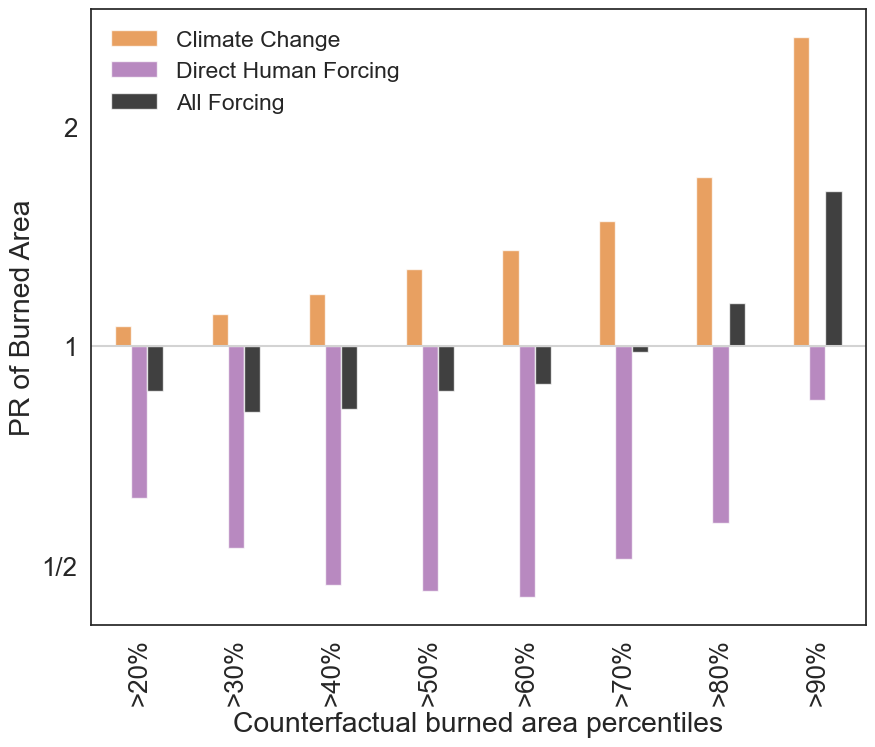

In [22]:
fig, ax = plt.subplots(figsize=(10, 8))
sns.set_theme(style='ticks', font_scale=1.5)

orange = sns.color_palette('tab10', 2)[-1]
purple = green_purple[1]
black = (0, 0, 0)
colors = [orange, purple, black]

xlabel = 'Counterfactual burned area percentiles'
ylabel = 'PR of Burned Area'
fig2_df_long = prepare_for_facetgrid(fig2_df).rename(columns={'index': xlabel, 'variable': 'Forcing', 'BA': ylabel})
bars = sns.barplot(fig2_df_long, x=xlabel, y=ylabel, hue='Forcing', width=0.5, palette=colors, alpha=0.75, ax=ax)

bars.set_xticks(np.arange(8))
bars.set_xticklabels([f'>{num}%' for num in range(20, 100, 10)], rotation=90)        
bars.set_yticks([-1.0, 0.0, 1.0])
bars.set_yticklabels(['1/2', '1', '2'])

bars.axhline(y=0.0, color='lightgrey')
bars.legend(frameon=False)

plt.savefig(os.path.join(FIGURES_PATH, 'Figure 2.png'), dpi=300, bbox_inches='tight')

#### Figure 3

In [27]:
warnings.simplefilter(action="default")
warnings.simplefilter(action="ignore", category=pd.errors.PerformanceWarning)

Let's generate the underlying data, we create the 21-year rolling mean relative anomaly for eahc of the models in each region. <br>
Then we multiply it by the model weights for each region. <br>
Third, we drop ORCHIDEE from the ARP region since it has some NaNs (ORCHIDEE ARP counterfactual has a number of months with 0 burned area, making the calculation of relative anomaly impossible). We also rescale the weights of the remaining models so they sum up to 1 gain. <br>
Then we sum for each region and add the CO2 data.

In [24]:
warnings.simplefilter(action="ignore")

In [25]:
from statsmodels.tsa.api import VAR 
cau = df_sampled.loc[df_sampled['Region'] == 'Central Australia (CAU)']
cau = cau.groupby('Date').mean()
cau

,Overburning (%),CO2
Date,,
1901,1.111926,296.13
1902,1.250137,296.48
1903,1.334016,296.83
1904,1.432164,297.20
1905,1.541651,297.63
...,...,...
2015,130.645349,399.65
2016,133.542543,403.06
2017,137.760703,405.22


In [26]:
model = VAR(cau) 
results = model.fit(maxlags=5) 
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Tue, 10, Oct, 2023
Time:                     12:12:38
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -3.08578
Nobs:                     114.000    HQIC:                  -3.39951
Log likelihood:          -95.5306    FPE:                  0.0269813
AIC:                     -3.61381    Det(Omega_mle):       0.0224416
--------------------------------------------------------------------
Results for equation Overburning (%)
                        coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------------
const                    -40.155944        10.178133           -3.945           0.000
L1.Overburning (%)         1.517848         0.099462           15.261           0.000
L1.CO2                    -0.1

In [17]:
cau = df_sampled.loc[df_sampled['Region'] == 'Central Australia (CAU)']
cau = cau.groupby('Date').mean()
cau

,Overburning (%),CO2
Date,,
1901,1.111926,296.13
1902,1.250137,296.48
1903,1.334016,296.83
1904,1.432164,297.20
1905,1.541651,297.63
...,...,...
2015,130.645349,399.65
2016,133.542543,403.06
2017,137.760703,405.22


In [186]:
warnings.filterwarnings('ignore') # Surpress some unimportant warnings
height = 3.5
years = 20
ylabel = 'Overburning (%)'
fontsize = 16

co2 = pd.read_csv(os.path.join(INPUT_PATH, 'co2_obsclim_annual_1850_2021.txt'), header=None, sep=' ', names=['Date', 'CO2'])

regionnames_full = {'WNA': 'Western North-America (WNA)', 'WSB': 'Western Siberia (WSB)', 'SES': 'Southeastern South-America (SES)', 'NAU': 'Northern Australia (NAU)'}
regionnames_short = {value: key for key, value in regionnames_full.items()}

obsclim_annual = to_annual(obsclim_df)
counterclim_annual = to_annual(counterclim_df)
obsclim_annual_rolling_mean = obsclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()
counterclim_annual_rolling_mean = counterclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()

df = (obsclim_annual_rolling_mean - counterclim_annual_rolling_mean)/counterclim_annual_rolling_mean
df = df.loc[:, regionnames_full.keys()]*100
df = df.rename(columns=regionnames_full)

# In our plot we want to whow both the mean and the model spread. If we take the weighted mean, we lose the spread. If we keep all 7 values, then we lose the weighting.
# (sns.replot has an estimator function but it doesn't allow us to create a weighted mean since it only passes the values to that function and not the names of the models these belong to as well).
# Therefore, we'll resample the cvalues for each year for each region 100 000 times, based on the model weights for that region.
# The relplot will then take the mean of these, which is a very close approximation (due to our high n=100 000) of our weighted mean.
df_sampled = pd.DataFrame(index=pd.MultiIndex.from_product([df.index, np.arange(10000)], names=['Date', 'idx']), columns=df.columns.unique(level='Region'))

for regionname in df.columns.unique(level='Region'):
    region_data = df.loc[:, regionname]
    df_sampled.loc[:, regionname] = region_data.sample(n=10000, weights=select_region(model_weights, regionnames_short[regionname]).values.ravel(), random_state=create_rng(SEED), replace=True, axis=1).values.ravel()

df_sampled = prepare_for_facetgrid(df_sampled).rename(columns={'BA': ylabel}).drop('idx', axis=1)
df_sampled = df_sampled.merge(co2, how='inner', on='Date')

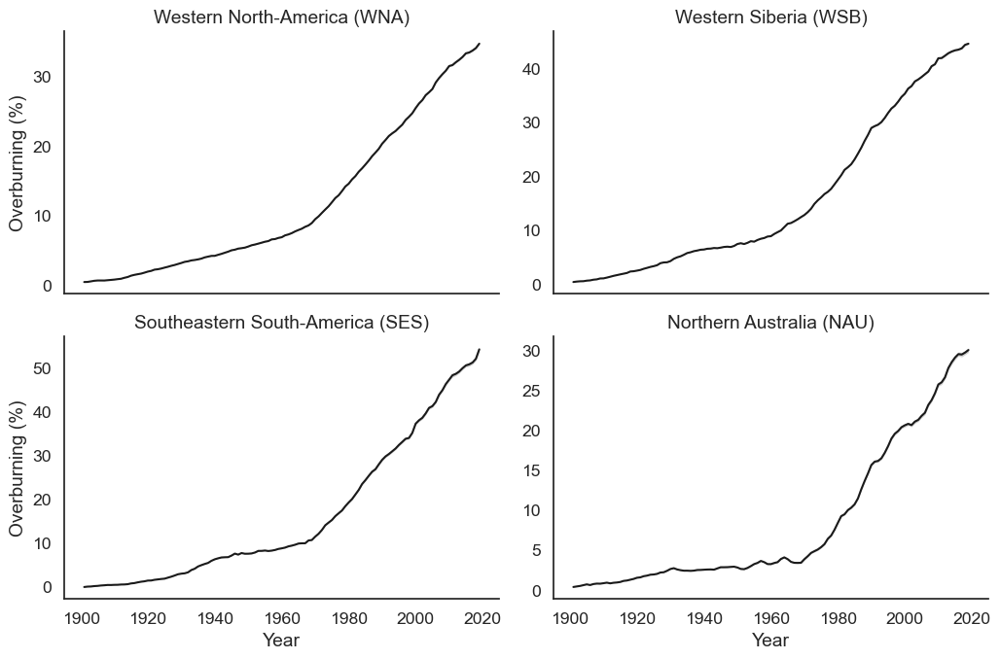

In [205]:
warnings.filterwarnings('ignore') # Surpress some unimportant warnings
sns.set_theme(style="white", font_scale=1.15)
figure = sns.relplot(data=df_sampled, x='Date', y=ylabel, col="Region", color='k', height=height, col_wrap=2, aspect=1.5, kind='line', facet_kws={'sharey': False}, errorbar=("ci", 50), err_kws={'linewidth': 0}) # Add relative anomaly line
#figure.map_dataframe(add_var, x='Date', y='CO2', color='black', linewidth=1, ylabel=f'CO$_2$ (ppm)', scale_param = ylabel) # Add CO2 line
#figure.map_dataframe(add_corr, x=ylabel, y='CO2', data=figure.data) # Add correlation

figure.set_xlabels(label='Year')
figure.set_titles(col_template="{col_name}")
figure.set(xticks=np.arange(1900, 2021, 20))

'''
for idx, ax in enumerate(figure.axes):
    ax.text(-0.07, 1.03, f'{"abcd"[idx]})', transform=ax.transAxes) # add sublabels
    ax.set_ylabel(ylabel, color='red')
    ax.spines['left'].set_color('red')
    ax.tick_params(axis='y', colors='red')
'''
#plt.subplots_adjust(wspace=0.5)

figure.savefig(os.path.join(FIGURES_PATH, 'Figure 3.png'), dpi=400)

In [204]:
select_region(model_weights, 'SES')

Region        SES                                                       \
Model     CLASSIC     JULES LPJ-GUESS-SIMFIRE-BLAZE LPJ-GUESS-SPITFIRE   
weights  0.165702  0.118589                0.207515           0.133381   

Region                                              
Model   ORCHIDEE-MICT-SPITFIRE     SSiB4     VISIT  
weights               0.119017  0.133902  0.121894

### Extended Data Figures

#### Extended Data Figure 1

Unfortunately Seaborn doesn't allow (yet) to combine multiple types of FacetGrids in one figure.
It also doesn't (easily) allow to combine different figures together.
Therefore, we'll use subplots here along with a somewhat more manual approach.

In [26]:
warnings.simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
warnings.simplefilter(action="ignore", category=RuntimeWarning)

In [27]:
start_year, end_year = 2003, 2019
selected_regions = ['CAU', 'SES','WSB', 'WNA']
xlabel1 = 'Relative Anomaly (%)'

obs = constrain_time(obs_df, start_year, end_year)
obs_anomaly = obs - obs.mean(axis=0)
obs_relative_anomaly = obs_anomaly/obs.mean(axis=0)*100

obsclim = constrain_time(obsclim_df, start_year, end_year)
obsclim_anomaly = obsclim - obsclim.mean(axis=0)
obsclim_relative_anomaly = obsclim_anomaly/obsclim.mean(axis=0)*100

obs_model_df = pd.concat([obs_relative_anomaly.rename_axis(['Region', 'Model'], axis=1), obsclim_relative_anomaly], axis=1)
data1 = prepare_for_facetgrid(obs_model_df).rename(columns={'BA': xlabel1})

obs_relative_anomaly_sorted = deepcopy(obs_relative_anomaly)
obs_relative_anomaly_sorted.loc[slice(None)] = np.sort(obs_relative_anomaly.values, axis=0)
obs_relative_anomaly_sorted = obs_relative_anomaly_sorted.reset_index().drop(columns='Date')

obsclim_relative_anomaly_sorted = deepcopy(obsclim_relative_anomaly)
obsclim_relative_anomaly_sorted.loc[slice(None)] = np.sort(obsclim_relative_anomaly.values, axis=0)
obsclim_relative_anomaly_sorted = obsclim_relative_anomaly_sorted.reset_index().drop(columns='Date')

obs_long_df = prepare_for_facetgrid(obs_relative_anomaly_sorted).rename(columns={'BA': f'Observed {xlabel1}', 'Model': 'Observation'})
obsclim_long_df = prepare_for_facetgrid(obsclim_relative_anomaly_sorted).rename(columns={'BA': f'Modelled {xlabel1}'})
data2 = obs_long_df.merge(obsclim_long_df, how="right", on=['index', 'Region'])


f_sp_obs = obs_relative_anomaly.apply(periodogram, axis=0).sort_values(by=['Region', 'Observation'], axis=1)
f_sp_obs.index = ['f', 'sp']
f_sp_obs_df = pd.DataFrame(index=1/f_sp_obs.loc['f'].iloc[0], columns = f_sp_obs.columns)
for row_idx, row in f_sp_obs.melt(ignore_index=False).loc['sp'].iterrows():
    f_sp_obs_df.loc[slice(None), (row.Region, row.Observation)] = row.value
    
    
f_sp_obsclim = obsclim_relative_anomaly.apply(periodogram, axis=0).sort_values(by=['Region', 'Model'], axis=1)
f_sp_obsclim.index = ['f', 'sp']
f_sp_obsclim_df = pd.DataFrame(index=1/f_sp_obsclim.loc['f'].iloc[0], columns = f_sp_obsclim.columns)
for row_idx, row in f_sp_obsclim.melt(ignore_index=False).loc['sp'].iterrows():
    f_sp_obsclim_df.loc[slice(None), (row.Region, row.Model)] = row.value
    
f_sp_df = pd.concat([f_sp_obs_df.rename_axis(['Region', 'Model'], axis=1), f_sp_obsclim_df], axis=1)
data3 = prepare_for_facetgrid(f_sp_df).rename(columns={'BA': 'Variance (Relative Anomaly$^2$)', 'index': 'Period (months)'})

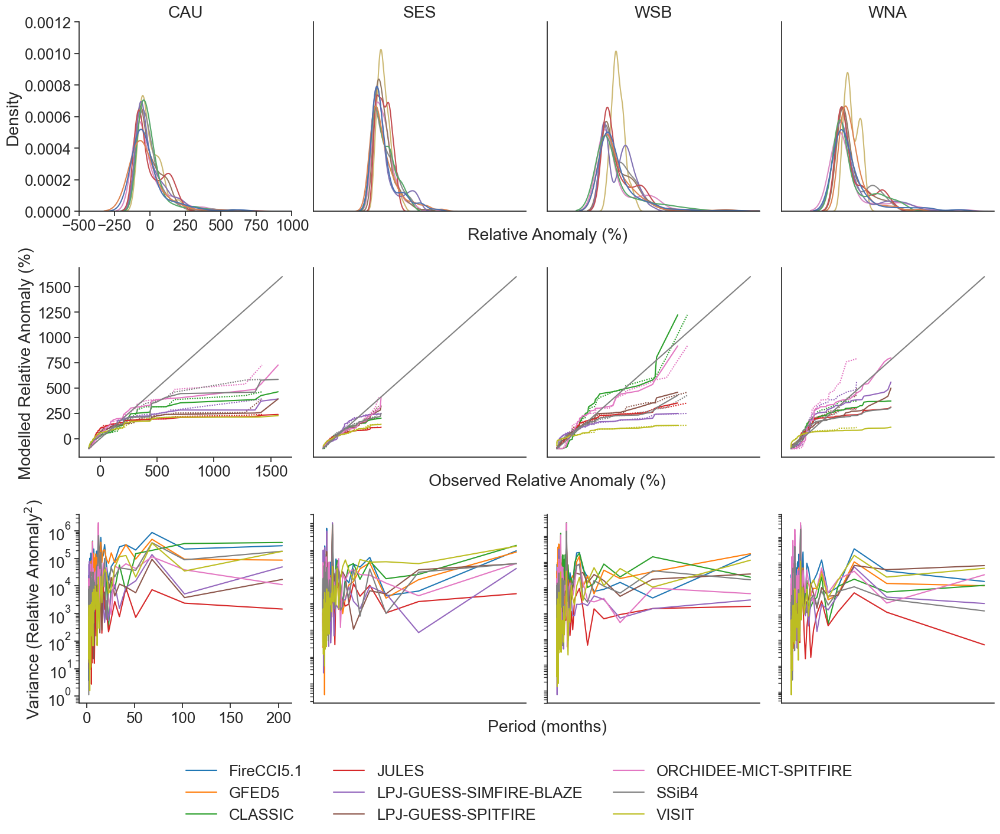

In [28]:
sns.set_theme(font_scale=1.7, style='ticks')
fig, axs = plt.subplots(3, 4, figsize=(20, 15), gridspec_kw={'hspace': 0.3, 'wspace': 0.1})
axs = axs.ravel() 

colors = sns.color_palette("tab10", 9)
obscolors = colors[:2]
modelcolors = colors[2:]

for idx, regionname in enumerate(selected_regions):
    region_axs = [axs[idx], axs[idx+4], axs[idx+8]]
    ax = region_axs[0]
    sns.kdeplot(data1[data1.Region==regionname], x=xlabel1, ax=ax, hue='Model', bw_adjust=1, legend=False, color=colors)
    ax.set_xlim(-500, 1000)
    ax.set_ylim(0, 0.0012)
    ax.set_title(regionname)        
        
    ax = region_axs[1]
    sns.lineplot(data=data2[(data2.Region==regionname) & (data2.Observation=='GFED5')], x=f'Observed {xlabel1}', y=f'Modelled {xlabel1}', hue='Model', ax=ax, dashes=(1, 1), legend=False, palette=modelcolors)
    sns.lineplot(data=data2[(data2.Region==regionname) & (data2.Observation=='FireCCI5.1')], x=f'Observed {xlabel1}', y=f'Modelled {xlabel1}', hue='Model', ax=ax, legend=False, palette=modelcolors)
    line = [-100, 1600]
    sns.lineplot(x=line, y=line, ax=ax, color='grey')
    
    ax = region_axs[2]
    legend = (regionname=='SES')
    sns.lineplot(data=data3[data3.Region==regionname], x='Period (months)', y='Variance (Relative Anomaly$^2$)', hue='Model', ax=ax, legend=legend, palette=colors)
    ax.set_yscale('log')
    
    if regionname != 'CAU':
        for ax in region_axs:
            ax.set_ylabel('')
            ax.set_yticks([], [])
            ax.set_xticks([], [])
            
    if regionname == 'SES':
        region_axs[0].set_xlabel(f'                                                       {xlabel1}')
        region_axs[1].set_xlabel(f'                                                       Observed {xlabel1}')
        region_axs[2].set_xlabel(f'                                                       Period (months)') 
        for ax in region_axs:
            ax.xaxis.labelpad = 20
    else:    
        for ax in region_axs:
            ax.set_xlabel('')
        
for ax in axs:
    ax.spines[['right', 'top']].set_visible(False)
    
sns.move_legend(axs[9], "lower right", bbox_to_anchor=(2.6, -0.7), frameon=False, ncol=3, title='')
plt.savefig(os.path.join(FIGURES_PATH, 'Extended Data Figure 1.png'), dpi=300, bbox_inches='tight')
sns.set_theme()

### Supplementary Figures

#### Supplementary Figure 1

The code here is similar as Figure 1a, but for two different time periods.

1901-1920 factual relative anomaly

In [29]:
obsclim_global = obsclim_df.groupby('Model', axis=1).sum()
counterclim_global = counterclim_df.groupby('Model', axis=1).sum()

obsclim = constrain_time(obsclim_global, 1901, 1920)
counterclim = constrain_time(counterclim_global, 1901, 1920)

df = (obsclim-counterclim.mean(axis=0))/counterclim.mean(axis=0)

series = pd.Series(df.values.ravel())
obsclim_early_sampled_global = series.sample(n=100000, weights=np.tile(select_region(model_weights, 'Global').values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True)

1901-1920 counterfactual relative anomaly

In [30]:
obsclim_global = obsclim_df.groupby('Model', axis=1).sum()
counterclim_global = counterclim_df.groupby('Model', axis=1).sum()

obsclim = constrain_time(obsclim_global, 1950, 2019)
counterclim = constrain_time(counterclim_global, 1950, 2019)

df = (obsclim-counterclim.mean(axis=0))/counterclim.mean(axis=0)

series = pd.Series(df.values.ravel())
obsclim_1950_sampled_global = series.sample(n=100000, weights=np.tile(select_region(model_weights, 'Global').values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True)

1950-2019 factual relative anomaly

In [31]:
obsclim_global = obsclim_df.groupby('Model', axis=1).sum()
counterclim_global = counterclim_df.groupby('Model', axis=1).sum()

obsclim = constrain_time(obsclim_global, 1901, 1920)
counterclim = constrain_time(counterclim_global, 1901, 1920)

df = (counterclim-counterclim.mean(axis=0))/counterclim.mean(axis=0)

series = pd.Series(df.values.ravel())
counterclim_early_sampled_global = series.sample(n=100000, weights=np.tile(select_region(model_weights, 'Global').values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True)

1950-2019 counterfactual relative anomaly

In [32]:
obsclim_global = obsclim_df.groupby('Model', axis=1).sum()
counterclim_global = counterclim_df.groupby('Model', axis=1).sum()

obsclim = constrain_time(obsclim_global, 1950, 2019)
counterclim = constrain_time(counterclim_global, 1950, 2019)

df = (counterclim-counterclim.mean(axis=0))/counterclim.mean(axis=0)

series = pd.Series(df.values.ravel())
counterclim_1950_sampled_global = series.sample(n=100000, weights=np.tile(select_region(model_weights, 'Global').values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True)

Create the figure

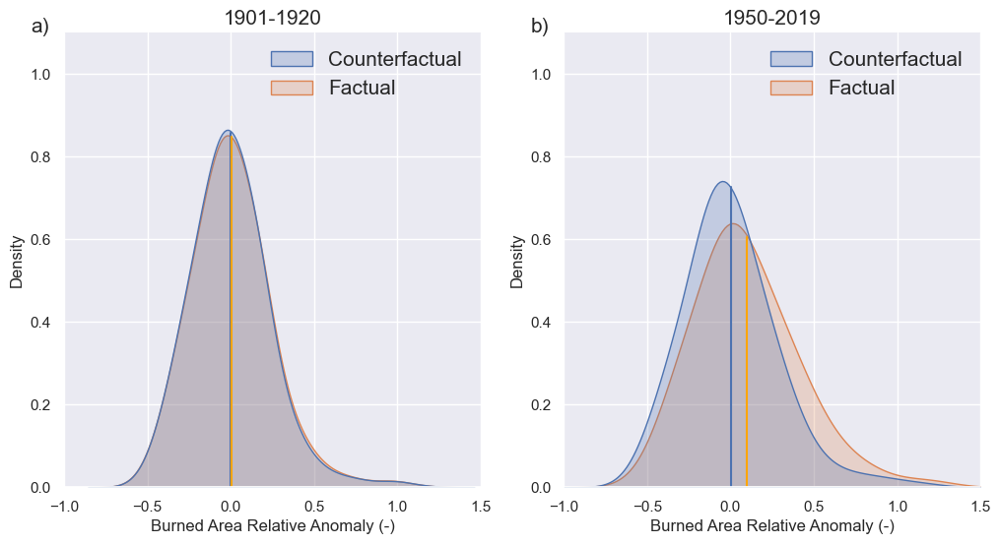

In [33]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs = axs.ravel()
bw_adjust = 4 
xlabel = 'Burned Area Relative Anomaly (-)'

sns.set_theme(style='white', rc={'axes.titlesize': 15, 'xtick.labelsize': 15, 'ytick.labelsize': 15, 'font.size': 15, 'legend.fontsize': 15, 'legend.title_fontsize': 15, 'axes.labelsize': 15})

ax = axs[0]
data = pd.concat([counterclim_early_sampled_global, obsclim_early_sampled_global], keys=['Counterfactual', 'Factual'], names=['1901-1920'], axis=0).reset_index().drop('level_1', axis=1).rename(columns={0: xlabel})
sns.kdeplot(data, hue='1901-1920', x=xlabel, fill=True, ax=ax, bw_adjust=bw_adjust)

ax.axvline(x=counterclim_early_sampled_global.mean(), ymin=0, ymax=0.78)
ax.axvline(x=obsclim_early_sampled_global.mean(), ymin=0, ymax=0.77, c='orange')
ax.set_ylim([0, 1.1])
ax.set_xlim([-1, 1.5])
ax.set_title('1901-1920', fontsize='medium')
sns.despine(ax=ax)
sns.move_legend(ax, loc='upper right', frameon=False, fontsize='medium', title_fontsize='medium', title='')
ax.text(s='a)', x=ax.viewLim.get_points()[0, 0]-0.2, y=ax.viewLim.get_points()[1, 1])


ax = axs[1]
data = pd.concat([counterclim_1950_sampled_global, obsclim_1950_sampled_global], keys=['Counterfactual', 'Factual'], names=['1950-2019'], axis=0).reset_index().drop('level_1', axis=1).rename(columns={0: xlabel})
sns.kdeplot(data, hue='1950-2019', x=xlabel, fill=True, ax=ax, bw_adjust=bw_adjust)

ax.axvline(x=counterclim_1950_sampled_global.mean(), ymin=0, ymax=0.66)
ax.axvline(x=obsclim_1950_sampled_global.mean(), ymin=0, ymax=0.55, c='orange')
ax.set_ylim([0, 1.1])
ax.set_xlim([-1, 1.5])
ax.set_title('1950-2019', fontsize='medium')
sns.despine(ax=ax)
sns.move_legend(ax, loc='upper right', frameon=False, fontsize='medium', title_fontsize='medium', title='')
_ = ax.text(s='b)', x=ax.viewLim.get_points()[0, 0]-0.2, y=ax.viewLim.get_points()[1, 1])
plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 1.png'), dpi=300, bbox_inches='tight')

#### Supplementary Figure 2

Same code as Figure 3, but for all regions instead of the selected 4.
We also don't resample since showing the model spread in these plots makes them quite unreadable. 
Therefore, we can just calculate the weighted model mean and pass it to the relplot function.

In [34]:
warnings.simplefilter(action="default")
warnings.simplefilter(action="ignore", category=pd.errors.PerformanceWarning)

In [35]:
years = 20
ylabel = 'Overburning (%)'

co2 = pd.read_csv(os.path.join(INPUT_PATH, 'co2_obsclim_annual_1850_2021.txt'), header=None, sep=' ', names=['Date', 'CO2'])
obsclim_annual = to_annual(obsclim_df)
counterclim_annual = to_annual(counterclim_df)
obsclim_annual_rolling_mean = obsclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()
counterclim_annual_rolling_mean = counterclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()

df = (obsclim_annual_rolling_mean - counterclim_annual_rolling_mean)/counterclim_annual_rolling_mean
df = df.multiply(model_weights.drop(labels='Global', axis=1).values, axis=1)

df = df.drop(columns=('ARP', 'ORCHIDEE-MICT-SPITFIRE'))
df.loc[:, 'ARP'] = (df.loc[:, 'ARP']/select_region(model_weights, 'ARP').drop(columns='ORCHIDEE-MICT-SPITFIRE', level=1).sum(axis=1).values[0]).values

df = df.groupby(axis=1, level='Region').sum()
df = prepare_for_facetgrid(df).rename(columns={'BA': ylabel})
df = df.merge(co2, how='inner', on='Date')

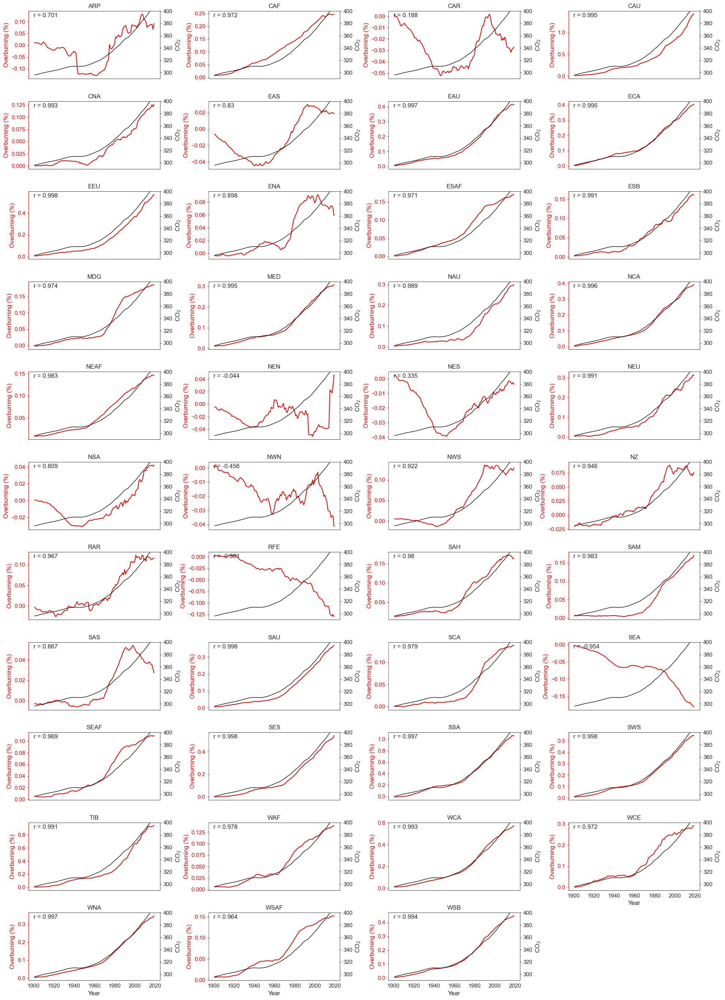

In [36]:
warnings.filterwarnings('ignore')
sns.set_theme(style='white', rc={'axes.linewidth': 0.7, 'ytick.major.width':0.7, 'ytick.major.size':3, 'xtick.major.size':3, 'xtick.major.width':0.7})
height = 2.5

figure = sns.relplot(data=df, x='Date', y=ylabel, col="Region", color='red', height=height, col_wrap=4, aspect=2, kind='line', facet_kws={'sharey': False}) # Add relative anomaly
figure.map_dataframe(add_var, x='Date', y='CO2', color='black', linewidth=1, ylabel=f'CO$_2$', scale_param=ylabel) # Add CO2
figure.map_dataframe(add_corr, x=ylabel, y='CO2', data=figure.data) # Add correlation between relative anomaly and CO2

figure.set_titles(col_template="{col_name}", fontsize=15)
figure.set_xlabels(label='Year')
figure.set_ylabels(label=ylabel)
figure.set(xticks=np.arange(1900, 2021, 20))

for idx, ax in enumerate(figure.axes): # Color the overburning axis red
    ax.set_ylabel(ylabel, color='red')
    ax.spines['left'].set_color('red')
    ax.tick_params(axis='y', colors='red')

figure.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 2.png'), dpi=600, bbox_inches='tight')
warnings.filterwarnings('default')

#### Supplementary Figure 3

In [37]:
warnings.simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
warnings.simplefilter(action="ignore", category=DeprecationWarning)
years = 20
obsclim_annual = to_annual(obsclim_df)
counterclim_annual = to_annual(counterclim_df)
obsclim_annual_rolling_mean = obsclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()
counterclim_annual_rolling_mean = counterclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()

df = (obsclim_annual_rolling_mean - counterclim_annual_rolling_mean)/counterclim_annual_rolling_mean
df = constrain_time(df, 1980, 2019)*100

In [38]:
trend_df = pd.DataFrame(index=obsclim_df.columns.unique(level='Region'), columns=['slope', 'stderr', 'formatted'])
for regionname in trend_df.index:
    region_df = select_region(df, regionname)
    region_weights = model_weights.loc[slice(None), regionname]

    if regionname == 'ARP':
        region_df = region_df.drop('ORCHIDEE-MICT-SPITFIRE', axis=1, level='Model')
        region_weights = region_weights.drop('ORCHIDEE-MICT-SPITFIRE', axis=1)

    weights = region_weights.values.flatten()
    region_data = region_df.values

    # Calculate the weighted slopes
    slopes = np.array([stats.linregress(np.arange(len(time_series)), time_series).slope for time_series in region_data.T])
    weighted_slope = np.sum(slopes * weights)

    # Calculate the weighted standard error of the slope
    num_data_points = len(region_df)
    weighted_slopes_std = np.sqrt(np.average((slopes - weighted_slope)**2, weights=weights))
    weighted_slope_standard_error = weighted_slopes_std / np.sqrt(num_data_points)

    trend_df.loc[regionname, ('slope', 'stderr', 'formatted')] = (weighted_slope.astype(float), weighted_slope_standard_error.astype(float), f'{weighted_slope.round(2)} ± {weighted_slope_standard_error.round(2)}')

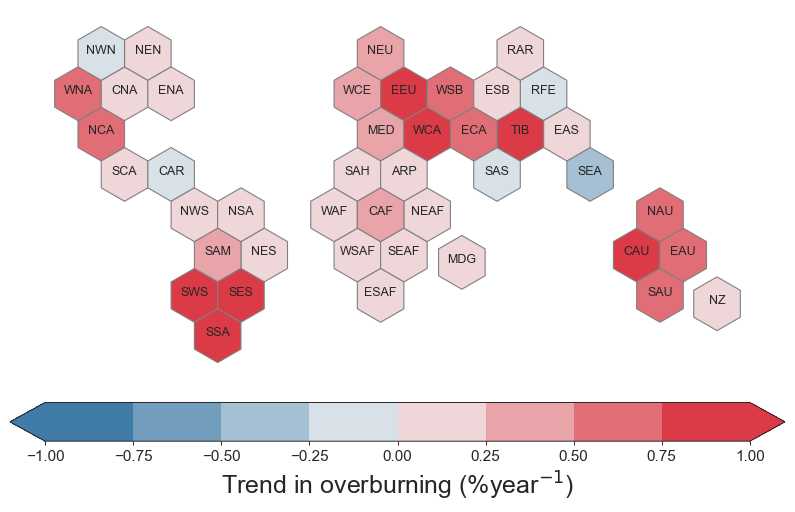

In [39]:
hexagons = gpd.read_file(DATA_PATH+'Supplementary_Data/ipcc-master/zones.gpkg').rename(columns={'label': 'Region'})
trend_series = trend_df.slope.astype(float)
trend_series.name = 'Trend'
hexagons = hexagons.merge(trend_series, on='Region')

cmap=sns.diverging_palette(240, 10, sep=1, n=8)
cmap = mcolors.ListedColormap(cmap.as_hex())
trend_min, trend_max = -1, 1

vmin, vmax, vcenter= trend_min, trend_max, 0
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)

ax = hexagons.plot(figsize=(10,6))
hexagons.plot(column='Trend', cmap=cmap, norm=norm, linewidth=0.8, edgecolor='gray', legend=False, ax=ax)
hexagons.apply(lambda x: ax.annotate(text=x['Region'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=9), axis=1);
cbar = plt.colorbar(cbar, orientation='horizontal', extend='both', pad=0.05)
cbar.ax.set_xlabel('Trend in overburning (%year$^{-1}$)', fontsize=18)
plt.axis('off')
plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 3.png'), dpi=300, bbox_inches='tight')
plt.show()

#### Supplementary Figure 4

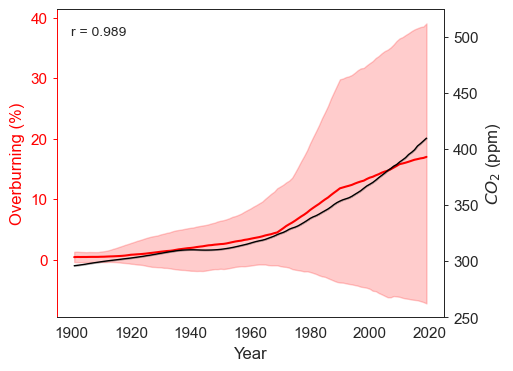

In [40]:
warnings.filterwarnings('ignore') # Surpress some unimportant warnings
sns.set_theme(style='white', rc={'axes.linewidth': 0.7, 'ytick.major.width':0.7, 'ytick.major.size':3, 'xtick.major.size':3, 'xtick.major.width':0.7})
fig = plt.figure(figsize=(5,4))

ylabel = 'Overburning (%)'
years = 20 
co2 = pd.read_csv(os.path.join(INPUT_PATH, 'co2_obsclim_annual_1850_2021.txt'), header=None, sep=' ', names=['Date', 'CO2'])

obsclim_annual = to_global(to_annual(obsclim_df))
counterclim_annual = to_global(to_annual(counterclim_df))
obsclim_annual_rolling_mean = obsclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()
counterclim_annual_rolling_mean = counterclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()

df = (obsclim_annual_rolling_mean - counterclim_annual_rolling_mean)/counterclim_annual_rolling_mean*100
df_sampled = df.sample(n=10000, weights=select_region(model_weights, 'Global').values.ravel(), random_state=create_rng(SEED), replace=True, axis=1)
df_sampled = prepare_for_facetgrid(df_sampled).rename(columns={'BA': ylabel})
df_sampled = df_sampled.merge(co2, how='inner', on='Date')

ax = sns.lineplot(data=df_sampled, x='Date', y=ylabel, color='red', figure=fig, errorbar=('pi'))
new_ax = plt.twinx()
sns.lineplot(data=df_sampled, x='Date',  y='CO2', color='black', linewidth=1, ax=new_ax)
new_ax.set_ylabel(f'$CO_2$ (ppm)')
new_ax.set(ylim=(250, 525))
new_ax.spines['left'].set_visible(False)

data = df_sampled.groupby(['Date']).mean().reset_index()
x, y = data.loc[:, ylabel], data.loc[:, 'CO2']
corr = pearsonr(x.values, y.values)
test = ax.text(x=1900, y=df_sampled.loc[:, ylabel].max() * 0.95, s=f'r = {round(corr[0], 3)}', fontsize=10)

ax.set_ylabel(ylabel, color='red')
ax.spines['left'].set_color('red')
ax.tick_params(axis='y', colors='red')

ax.set_xlabel('Year')
plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 4.png'), dpi=400, bbox_inches='tight')

#### Supplementary Figure 5

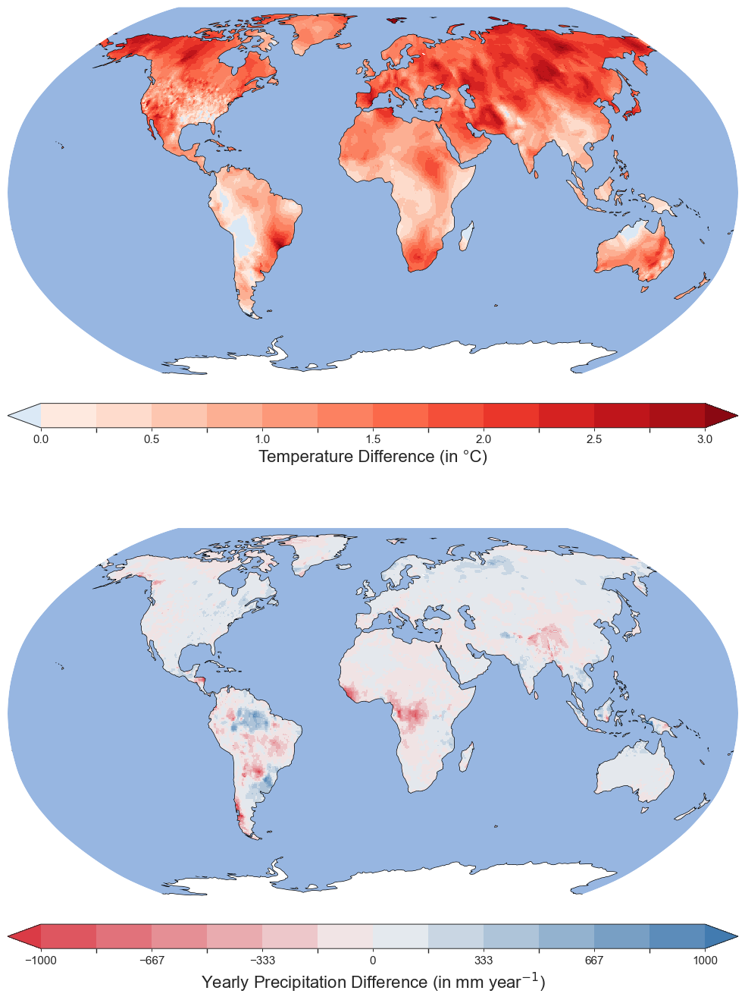

In [41]:
fig, axs = plt.subplots(2, 1, figsize=(10, 14), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()

cmap_1 = sns.color_palette("vlag", as_cmap=True)
norm = mcolors.TwoSlopeNorm(vcenter=0, vmin=-3, vmax=3)
colors_1 = [sns.color_palette('Blues', n_colors=13)[1]] + sns.color_palette('Reds', n_colors=13)[:]


# Temperature
ax = axs[0]
temp_obsclim = xr.open_dataset(os.path.join(INPUT_PATH, 'gswp3-w5e5_obsclim_tas_global_yearly.nc'))
temp_counterclim = xr.open_dataset(os.path.join(INPUT_PATH, 'gswp3-w5e5_counterclim_tas_global_yearly.nc'))
temp_diff = temp_obsclim - temp_counterclim

temp_plot = temp_diff.tas[-17:].reduce(np.mean, 'time').plot.imshow(ax=ax, levels=13, transform=ccrs.PlateCarree(), vmin=0, vmax=3, colors=colors_1, cbar_kwargs={'location': 'bottom', 'orientation': 'horizontal', 'aspect': 30, 'pad': 0.05})
temp_plot.colorbar.set_label('Temperature Difference (in °C)', fontsize=16)

ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.spines['geo'].set_visible(False)

# Precipitation
ax = axs[1]
n_colors = 13
cmap = sns.diverging_palette(10, 245, sep=1, as_cmap=True)
pr_obsclim = xr.open_dataset(os.path.join(INPUT_PATH, 'gswp3-w5e5_obsclim_pr_global_yearly.nc'))
pr_counterclim = xr.open_dataset(os.path.join(INPUT_PATH, 'gswp3-w5e5_counterclim_pr_global_yearly.nc'))
pr_diff = (pr_obsclim - pr_counterclim) * 60 * 60 * 24 # Convert from mm/s to mm/year (no need to multiply by 365 since we already took the sum)

pr_plot = pr_diff.pr[-17:].reduce(np.mean, 'time').plot.imshow(ax=ax, vmin=-1000, vmax=1000, levels=n_colors, transform=ccrs.PlateCarree(), cmap=cmap, cbar_kwargs={'location': 'bottom', 'orientation': 'horizontal', 'aspect': 30, 'pad': 0.05})
pr_plot.colorbar.set_label('Yearly Precipitation Difference (in mm year$^{-1}$)', fontsize=16)

ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.spines['geo'].set_visible(False)
plt.tight_layout()
plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 5'), dpi=400, bbox_inches = 'tight')

#### Supplementary Figure 6

In [42]:
def preprocess_xarray(dataArray):
    dataArray.coords()[0].guess_bounds()
    dataArray.coords()[1].guess_bounds()
    dataArray.coords()[2].guess_bounds()
    dataArray.standard_name = None
    dataArray.long_name = None
    dataArray.var_name = None
    dataArray.coords()[1].units = cf_units.Unit('degrees')
    dataArray.coords()[2].units = cf_units.Unit('degrees')
    dataArray.coords()[1].coord_system = iris.coord_systems.GeogCS(6371229)
    dataArray.coords()[2].coord_system = iris.coord_systems.GeogCS(6371229)
    dataArray.coords()[1].long_name = 'Latitude'
    dataArray.coords()[2].long_name = 'Longitude'
    return dataArray

In [43]:
warnings.simplefilter(action="ignore", category=UserWarning)
veg_C_path = os.path.join(DATA_PATH, 'ISIMIP', 'ISIMIP3a', 'OutputData', 'VegetationCarbon', '')
filenames = os.listdir(veg_C_path)
cveg_dict = {filename.split('_')[0]: {} for filename in filenames if filename.endswith('.nc')}

for model_name in cveg_dict.keys():
    model_files = list(filter(lambda x: f'{model_name}' in x, filenames))
    for sim in ('obsclim', 'counterclim'):
        cveg_dict[model_name][sim] = next(f'{veg_C_path}{filename}' for filename in model_files if sim in filename)
        
cveg_dict['CLASSIC'] = cveg_dict.pop('classic')
cveg_dict['JULES'] = cveg_dict.pop('jules-vn6p3')
cveg_dict['ORCHIDEE-MICT-SPITFIRE'] = cveg_dict.pop('orchidee')
cveg_dict['SSiB4'] = cveg_dict.pop('ssib4-triffid-fire')
cveg_dict['VISIT'] = cveg_dict.pop('visit')

cveg_diff_dict = {}

for modelname in obsclim_df.columns.unique(level='Model'):
    carbonveg_obsclim = xr.open_dataset(cveg_dict[modelname]['obsclim'], decode_times=False) 
    carbonveg_counterclim = xr.open_dataset(cveg_dict[modelname]['counterclim'], decode_times=False)
    obsclim_var = list(dict(carbonveg_obsclim.data_vars).keys())[0]
    counterclim_var = list(dict(carbonveg_counterclim.data_vars).keys())[0]
    
    carbonveg_obsclim = carbonveg_obsclim.rename({obsclim_var: 'vegetation_carbon_content'})
    carbonveg_counterclim = carbonveg_counterclim.rename({counterclim_var: 'vegetation_carbon_content'})    
        
    carbonveg_obsclim_attrs = carbonveg_obsclim.coords['time'].attrs
    carbonveg_obsclim_attrs['units'] = 'days since 1901-01-01'
    carbonveg_obsclim_attrs['calendar'] = cf_units.CALENDAR_360_DAY 
    time_length = carbonveg_obsclim.dims['time']
    time_offspring = 360*119/time_length
    carbonveg_obsclim = carbonveg_obsclim.assign_coords(time = np.arange(0, time_length*time_offspring, time_offspring))  
    carbonveg_obsclim.coords['time'] = carbonveg_obsclim.coords['time'].assign_attrs(carbonveg_obsclim_attrs) 
        
    carbonveg_counterclim_attrs = carbonveg_counterclim.coords['time'].attrs
    carbonveg_counterclim_attrs['units'] = 'days since 1901-01-01'
    carbonveg_counterclim_attrs['calendar'] = cf_units.CALENDAR_360_DAY 
    time_length = carbonveg_counterclim.dims['time']
    time_offspring = 360*119/time_length
    carbonveg_counterclim = carbonveg_counterclim.assign_coords(time = np.arange(0, time_length*time_offspring, time_offspring))  
    carbonveg_counterclim.coords['time'] = carbonveg_counterclim.coords['time'].assign_attrs(carbonveg_counterclim_attrs) 
    
    carbonveg_obsclim['vegetation_carbon_content'].attrs['standard_name'] = 'vegetation_carbon_content'
    cveg_obsclim = carbonveg_obsclim['vegetation_carbon_content'].to_iris()
    carbonveg_counterclim['vegetation_carbon_content'].attrs['standard_name'] = 'vegetation_carbon_content'
    cveg_counterclim = carbonveg_counterclim['vegetation_carbon_content'].to_iris()
    cveg_obsclim = to_annual(preprocess_xarray(cveg_obsclim), 'mean')
    cveg_counterclim = to_annual(preprocess_xarray(cveg_counterclim), 'mean')
    
    cveg_obsclim.coords('time')[0].points = cveg_obsclim.coords('time')[0].points - cveg_obsclim.coords('time')[0].points[0]
    cveg_obsclim.coords('time')[0].bounds = None
    cveg_obsclim.coords('time')[0].guess_bounds()

    cveg_counterclim.coords('time')[0].points = cveg_counterclim.coords('time')[0].points - cveg_counterclim.coords('time')[0].points[0]
    cveg_counterclim.coords('time')[0].bounds = None
    cveg_counterclim.coords('time')[0].guess_bounds()
    
    cveg_diff = cveg_obsclim - cveg_counterclim
    
    if 'LPJ-GUESS' in modelname:
        cveg_diff = iris.util.reverse(cveg_diff, 'latitude')
    
    cveg_diff_dict[modelname] = cveg_diff

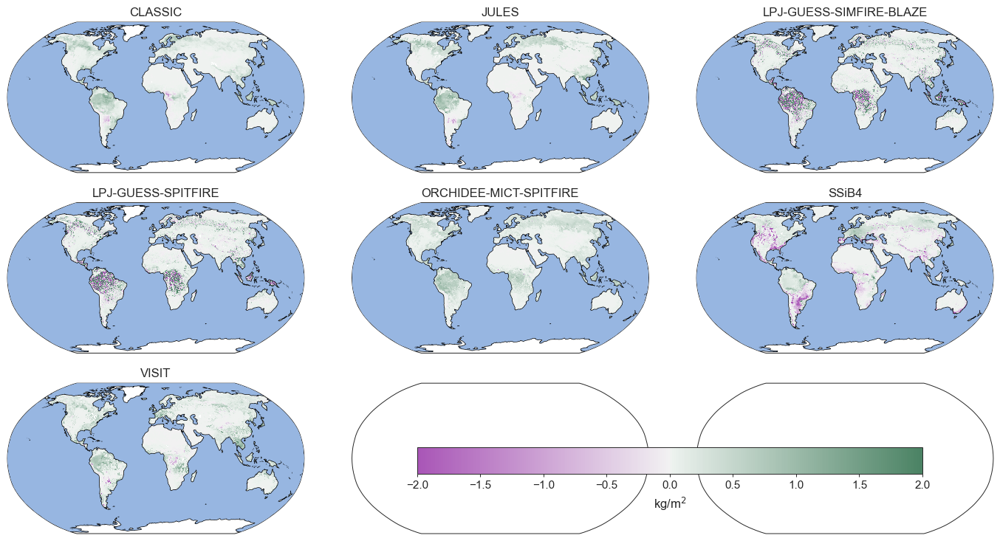

In [44]:
from iris import plot

fig, axs = plt.subplots(3, 3, figsize=(18, 9), subplot_kw={'projection': ccrs.Robinson()}, gridspec_kw={'wspace': 0.01})
axs = axs.ravel()

purple_green = sns.diverging_palette(300, 145, s=60, as_cmap=True)

for idx, (modelname, model_cube) in enumerate(cveg_diff_dict.items()):
    ax = axs[idx]
    cube_mean = model_cube.collapsed(['time'], iris.analysis.MEAN)
    mesh=iris.plot.pcolormesh(cube_mean, axes=ax, cmap=purple_green, vmin=-2, vmax=2)
    ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
    ax.add_feature(cartopy.feature.OCEAN, zorder=10)
    ax.set_title(modelname)

axs[-2].patch.set_facecolor('white')
axs[-1].patch.set_facecolor('white')
colorbar_axes = plt.gcf().add_axes([0.45, 0.2, 0.38, 0.04])
colorbar = plt.colorbar(mesh, colorbar_axes, orientation='horizontal', label='kg/m$^2$')
plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 6.png'), dpi=300, bbox_inches='tight')

#### Supplementary Figure 7

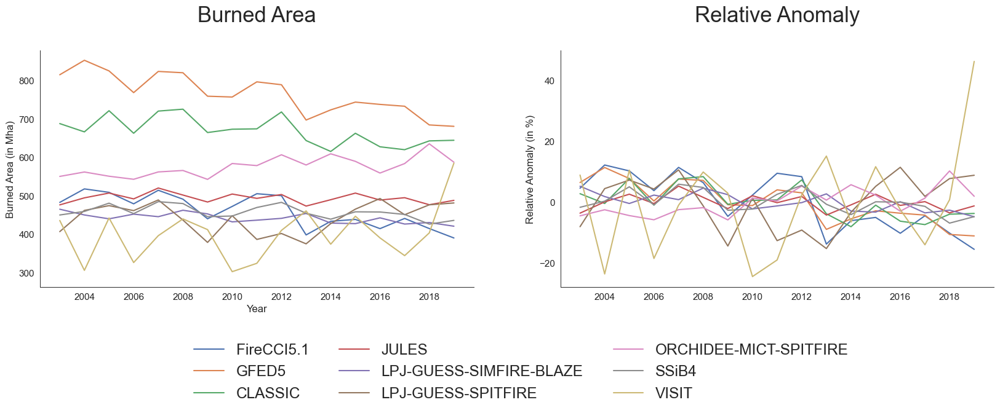

In [45]:
fig, axs = plt.subplots(1, 2, figsize=(20, 5))
axs = axs.ravel()
sns.set_theme(font_scale=1.6, style='ticks')

start_year, end_year = 2003, 2019

obs = constrain_time(to_global(to_annual(obs_df)), start_year, end_year)
obs_anomaly = obs - obs.mean(axis=0)
obs_relative_anomaly = obs_anomaly/obs.mean(axis=0)*100

obsclim = constrain_time(to_global(to_annual(obsclim_df)), start_year, end_year)
counterclim = constrain_time(to_global(to_annual(counterclim_df)), start_year, end_year)

obs_obsclim = pd.concat([obs, obsclim], axis=1)
# Here we calculate the relative anomalies by dividing by the factual mean (as opposed to the counterfactual mean).
# We do this because we need to divide the observations by their own means (they don't have a counterfactual), so we perform the same approach for the simulations.
relative_anomalies = (obs_obsclim-obs_obsclim.mean(axis=0))/obs_obsclim.mean(axis=0)*100
ymin, ymax = min([np.min(series.values) for series in [obs, obsclim, counterclim]]), max([np.max(series.values) for series in [obs, obsclim, counterclim]])

one = sns.lineplot(obs_obsclim, dashes=False, ax=axs[0])
two = sns.lineplot(relative_anomalies, dashes=False, ax=axs[1], legend=False)


one.set_ylim(ymin=ymin-25, ymax=ymax+25)

for ax in axs:
    ax.spines[['right', 'top']].set_visible(False)
    
one.set_title('Burned Area', y=1.1, fontdict={'fontsize': 25})
two.set_title('Relative Anomaly', y=1.1, fontdict={'fontsize': 25})

one.set_ylabel('Burned Area (in Mha)')
two.set_ylabel('Relative Anomaly (in %)')

one.set_xlabel('Year')
two.set_xlabel('')

sns.move_legend(one, "upper center", bbox_to_anchor=(1.11, -0.18), frameon=False, ncol=3)

plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 7.png'), bbox_inches='tight', dpi=300)

#### Supplementary Figure 8

In [3]:
obsclim_dict = {key: model_dict[key]['obsclim'] for key in model_dict.keys()}
obs_obsclim_dict = dict(obs_dict, **obsclim_dict)
obs_model_dict = dict(obs_dict, **model_dict)

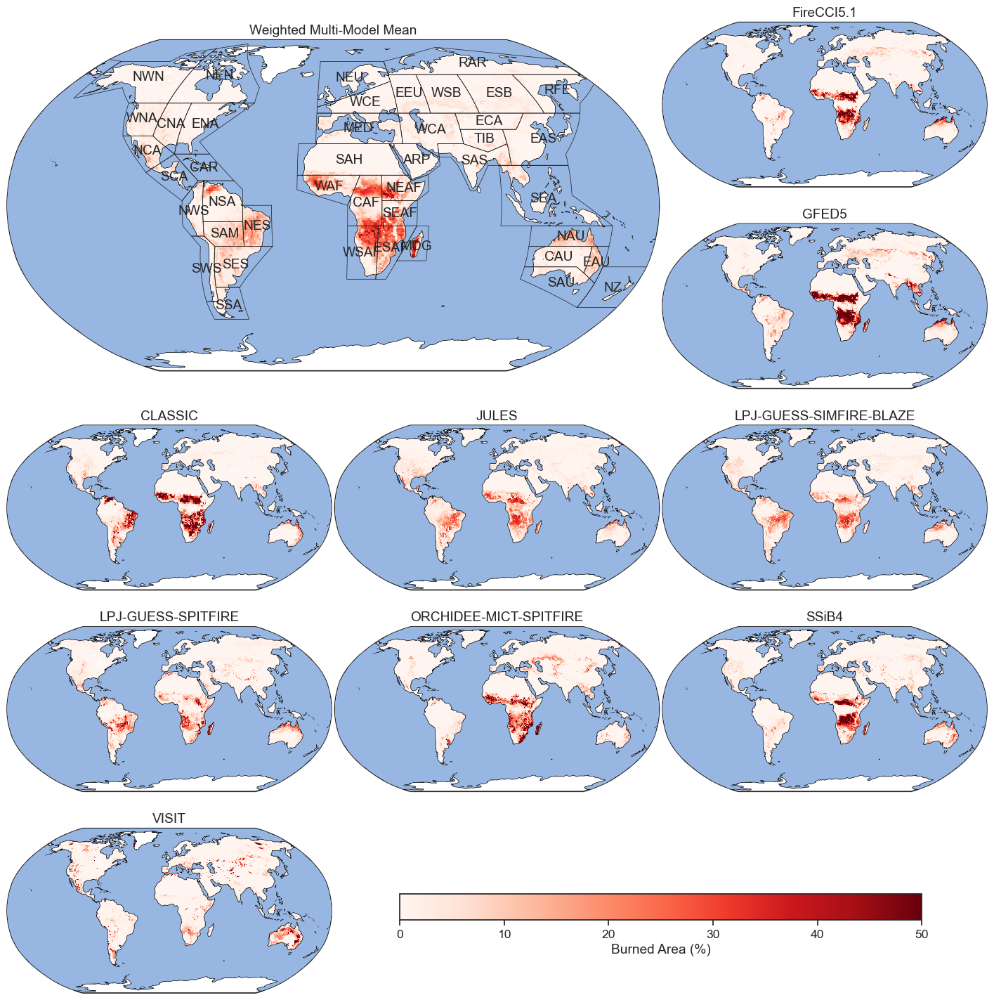

In [208]:
cmap = mpl.colormaps.get_cmap('Reds')  # viridis is the default colormap for imshow
cmap.set_bad(color='white')

figshape = [
    [0, 0, 1],
    [0, 0, 2],
    [3, 4, 5],
    [6, 7, 8],
    [9, 10, 10]
           ]

fig, axs = plt.subplot_mosaic(figshape, figsize=(18, 18), subplot_kw={'projection': ccrs.Robinson()}, gridspec_kw={'wspace': 0.01})

#fig, axs = plt.subplots(6, 3, figsize=(36, 9), subplot_kw={'projection': ccrs.Robinson()}, gridspec_kw={'wspace': 0.01})
#axs = axs.ravel()

weighted_multi_model_mean = np.ma.MaskedArray(data=np.zeros((360, 720)), mask=np.zeros((360, 720)))

obs_model_dict = dict(obs_dict, **model_dict)

# Make the regional plots
for idx, (name, loc) in enumerate(obs_model_dict.items()):
    ax = axs[idx+1]
    if type(loc) == str:
        cube = iris.load_cube(loc)
    else:
        cube = preprocess_model(iris.load_cube(loc['obsclim']), name)
    annual_mean_cube = pixel_mean(to_annual(constrain_time(cube, 2003, 2019)))
    
    mesh=iris.plot.pcolormesh(annual_mean_cube, axes=ax, cmap=cmap, vmin=0, vmax=50)
    ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
    ax.add_feature(cartopy.feature.OCEAN, zorder=10)
    ax.set_title(name)
    
    if name in model_dict.keys():
        for regionname in AR6_masks.keys():
            region_weighted_values = annual_mean_cube.data * ~AR6_masks[regionname].data * select_region(select_model(model_weights, name), regionname).values.squeeze()
            weighted_multi_model_mean += region_weighted_values

# Make the big multi-model mean plot            
annual_mean_cube.data = weighted_multi_model_mean
ax = axs[0]
mesh=iris.plot.pcolormesh(annual_mean_cube, axes=ax, cmap=cmap, vmin=0, vmax=50)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('Weighted Multi-Model Mean')
regionmask.defined_regions.ar6.land.__getitem__(np.arange(1, 44)).plot(ax=ax, label='abbrev', text_kws={'zorder':10, 'bbox': {'alpha': 0}}, line_kws={'lw':0.5, 'zorder':15})

#colorbar_axes = plt.gcf().add_axes([0.285, 0.02, 0.45, 0.04])
colorbar = plt.colorbar(mesh, ax=axs[10], orientation='horizontal', label='Burned Area (%)', fraction = 0.6, shrink=0.8) 
axs[10].set_frame_on(False)
plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 8.png'), dpi=300, bbox_inches='tight')

#### Supplementary Figure 9

Run Extended Data Figure 1 first.

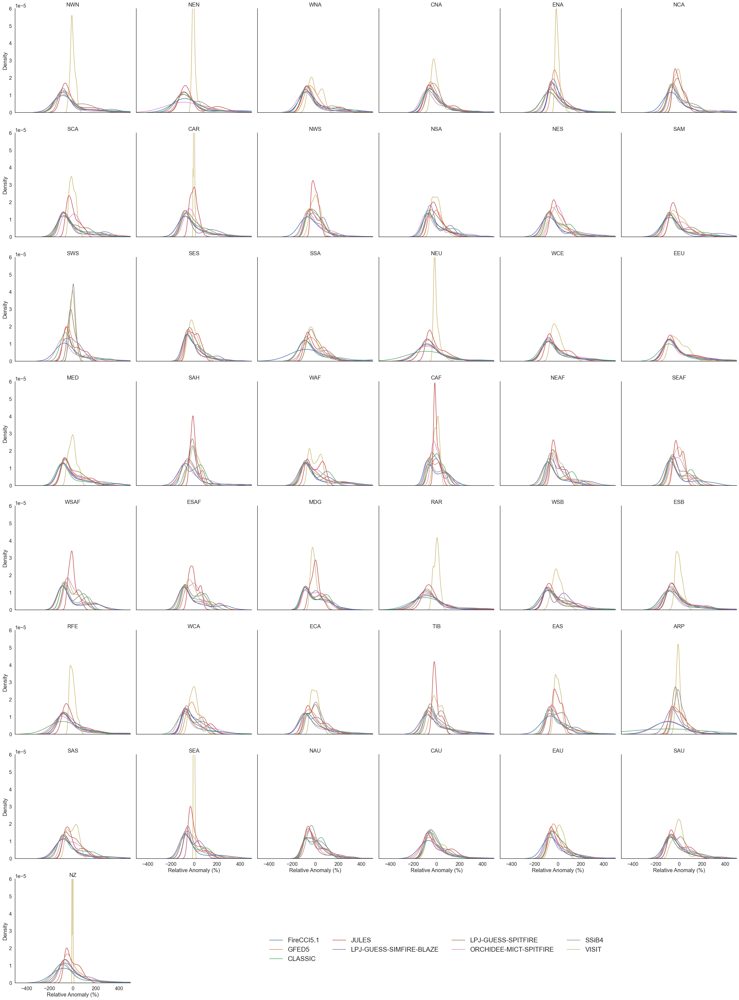

In [48]:
sns.set_theme(style='white', font_scale=1.3)
f_grid = sns.displot(data1, x=xlabel1, col='Region', hue='Model', kind='kde', ax=ax, bw_adjust=1, color=colors, col_wrap=6, facet_kws={'xlim': (-500, 500), 'ylim': (0, 0.00006)})
sns.move_legend(f_grid, "lower right", frameon=False, ncol=4, bbox_to_anchor=(0.73, 0.035), fontsize='large', title='')
f_grid.set_titles(row_template = '{row_name}', col_template = '{col_name}')
plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 9.png'), dpi=300, bbox_inches='tight')
sns.set_theme()

#### Supplementary Figure 10

Run Extended Data Figure 1 first.

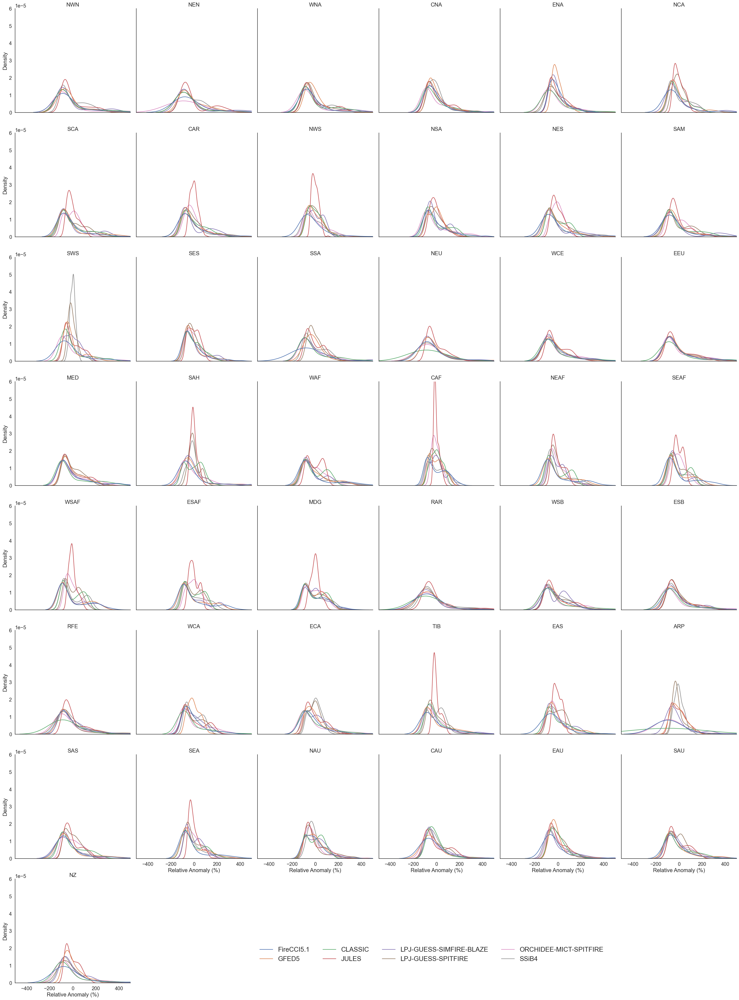

In [49]:
sns.set_theme(style='white', font_scale=1.3)
f_grid = sns.displot(data1[data1.Model != 'VISIT'], x=xlabel1, col='Region', hue='Model', kind='kde', ax=ax, bw_adjust=1, color=colors, col_wrap=6, facet_kws={'xlim': (-500, 500), 'ylim': (0, 0.00006)})#facet_kws={'xlim': (-500, 1000), 'ylim': (0, 0.00006)}
sns.move_legend(f_grid, "lower right", frameon=False, ncol=4, bbox_to_anchor=(0.73, 0.035), fontsize='large', title='')
f_grid.set_titles(row_template = '{row_name}', col_template = '{col_name}')
plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 10.png'), dpi=300, bbox_inches='tight')
sns.set_theme()

#### Supplementary Figure 11

Run Extended Data Figure 1 first.

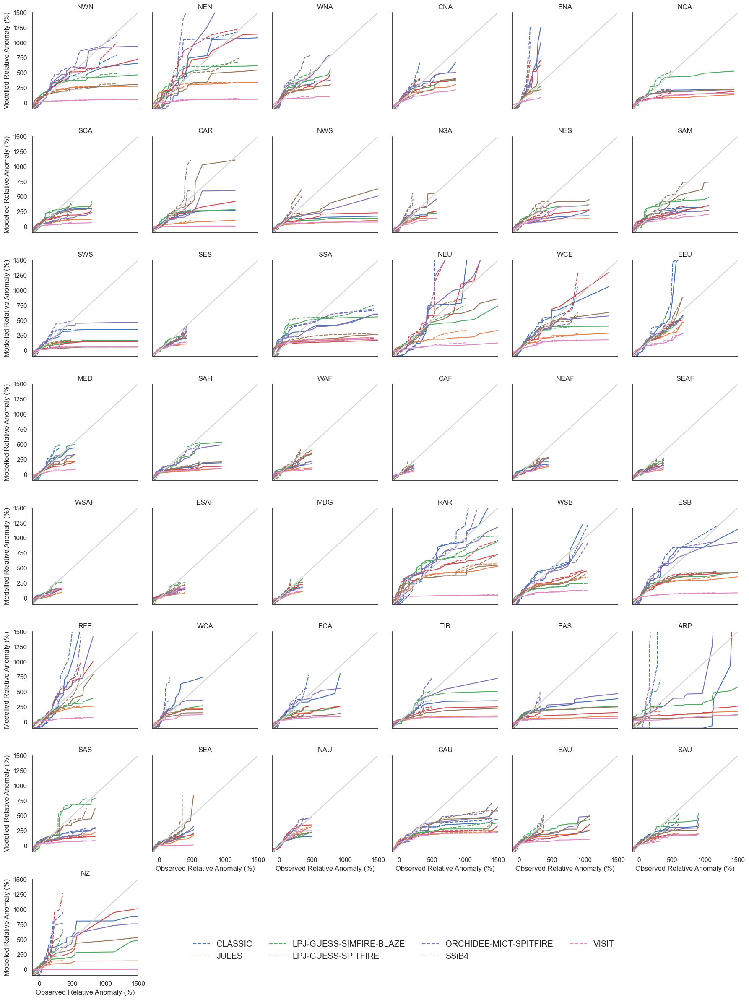

In [50]:
sns.set_theme(style='white', font_scale=1)
lim = [-100, 1500]
f_grid = sns.FacetGrid(data=data2, hue='Model', col='Region', col_wrap=6, legend_out=True, xlim=lim, ylim=lim)
f_grid.map_dataframe(sns.lineplot, x='Observed Relative Anomaly (%)', y='Modelled Relative Anomaly (%)', style=data2.Observation, legend='auto')    

f_grid.add_legend()
sns.move_legend(f_grid, "lower right", frameon=False, ncol=4, bbox_to_anchor=(0.73, 0.035), fontsize='large', title='')
f_grid.set_titles(row_template = '{row_name}', col_template = '{col_name}')
for ax in f_grid.axes:
    sns.lineplot(x=lim, y=lim, color='lightgrey', ax=ax, legend=False)

plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 11.png'), dpi=300, bbox_inches='tight')
sns.set_theme()

#### Supplementary Figure 12

Run Extended Data Figure 1 first.

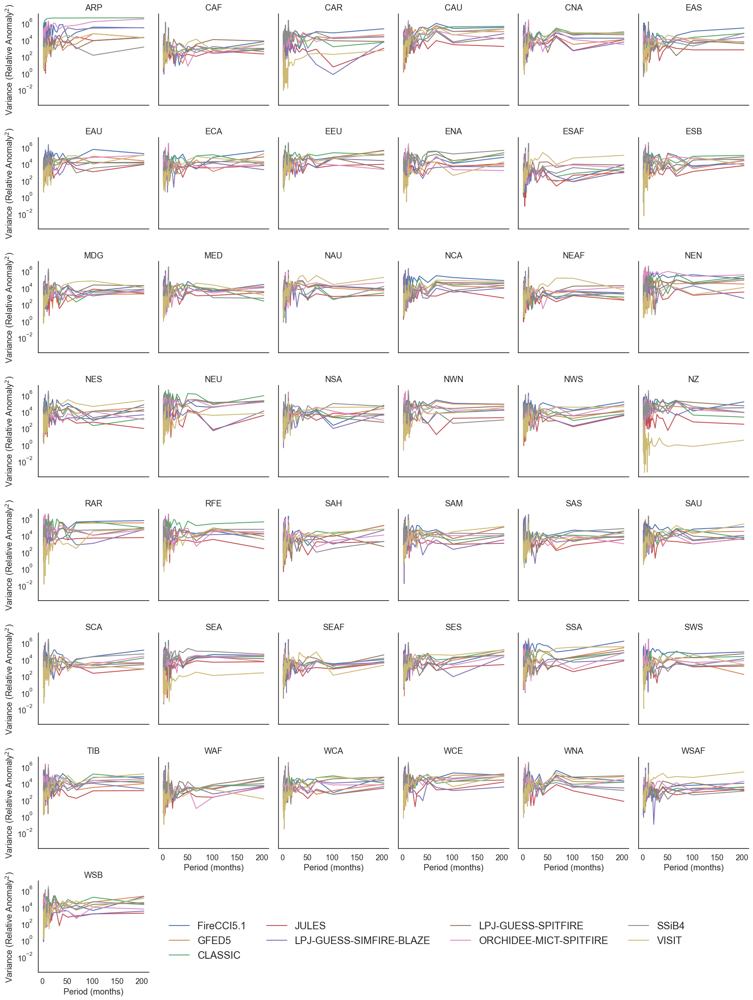

In [51]:
sns.set_theme(style='white', font_scale=1.2)
f_grid = sns.FacetGrid(data=data3, hue='Model', col='Region', col_wrap=6)
f_grid.map_dataframe(sns.lineplot, x='Period (months)', y='Variance (Relative Anomaly$^2$)')
f_grid.set(yscale='log')
f_grid.set_titles(row_template = '{row_name}', col_template = '{col_name}')

f_grid.add_legend()
sns.move_legend(f_grid, "lower right", frameon=False, ncol=4, bbox_to_anchor=(0.78, 0.035), fontsize='large', title='')
plt.savefig(os.path.join(FIGURES_PATH, 'Supplementary Figure 12.png'), dpi=300, bbox_inches='tight')
sns.set_theme()

## Tables

### Extended Data Tables

#### Extended Data Table 1

In [53]:
start_year, end_year = 2003, 2019
NME_scores = pd.DataFrame(index=pd.MultiIndex.from_tuples([(obs, nme) for obs in ['FireCCI5.1', 'GFED5'] for nme in ['$NME_3$ Rank.', '$NME_3$ Ann.']], names=['Observation', 'NME']), columns=obsclim_df.columns.unique(level='Model'))

for obsname in NME_scores.index.unique(level='Observation'):
    obs = to_global(select_model(constrain_time(obs_df, start_year, end_year), obsname))
    obs_ranked = obs[obsname].sort_values()
    obs_annual = to_annual(obs)[obsname]
    for modelname in NME_scores.columns.unique(level='Model'):
        model = to_global(select_model(constrain_time(obsclim_df, start_year, end_year), modelname))
        model_ranked = model[modelname].sort_values()
        model_annual = to_annual(model)[modelname]
        NME_scores.loc[(obsname), modelname] = [NME3_temporal(obs_ranked, model_ranked), NME3_temporal(obs_annual, model_annual)]
        
NME_scores_styled = NME_scores.astype(np.float64).round(2).style.background_gradient(cmap=sns.color_palette("vlag", as_cmap=True), vmin=0.5, vmax=1.5,axis=None)
NME_scores_styled.to_excel(os.path.join(TABLES_PATH, 'Extended Data Table 1.xlsx'))
NME_scores_styled

### Supplementary Tables

#### Supplementary Table 1

Need to run Fig. 1 and Fig. 2 and Supplementary Fig. 1 first

In [54]:
pdfs_global = {
    '1901-1920': (obsclim_early_sampled_global, counterclim_early_sampled_global), 
    '1950-2019': (obsclim_1950_sampled_global, counterclim_1950_sampled_global),
    '2003-2019': (obsclim_pd_sampled_global, counterclim_pd_sampled_global),
    'DHF': (counterclim_dhf_sampled_global, counterclim_early_sampled_global),
    'All Forcing': (all_pd_sampled_global, all_early_sampled_global)
}

columns = ['Change in Mean (%)', 'PR', 'KS Statistic']
table_s1 = pd.DataFrame(index=pdfs_global.keys(), columns=columns)

for idx_name, (pdf1, pdf2) in pdfs_global.items():
    change = (pdf1.mean(axis=0) - pdf2.mean(axis=0)) * 100
    pr = np.count_nonzero(pdf1 > (pdf2.mean(axis=0)))/np.count_nonzero(pdf2 > (pdf2.mean(axis=0)))
    stat = stats.kstest(pdf1, pdf2)[0]
    table_s1.loc[idx_name] = (change, pr, stat)
    
table_s1_styled = table_s1.round(2).style.format(precision=2)
table_s1_styled.to_excel(os.path.join(TABLES_PATH, 'Supplementary Table 1.xlsx'))
table_s1_styled

,Change in Mean (%),PR,KS Statistic
1901-1920,0.47,1.02,0.02
1950-2019,9.46,1.27,0.13
2003-2019,16.43,1.43,0.19
DHF,-15.83,0.47,0.35
All Forcing,-3.72,0.84,0.17


#### Supplementary Table 2

Run Table S1 and its dependencies first.

Calculate the regional relative anomaly for the DHF (present-day counterfacual compared to early counterfactual)

In [55]:
counterclim_pd = constrain_time(counterclim_df, 2003, 2019)
df = (counterclim_pd-counterclim_pd.mean(axis=0))/counterclim_pd.mean(axis=0)

counterclim_pd_sampled_regional = pd.DataFrame(index=np.arange(100000), columns=df.columns.unique(level='Region'))

for regionname in df.columns.unique(level='Region'):
    region_series = pd.Series(df.loc[slice(None), regionname].values.ravel())
    counterclim_pd_sampled_regional.loc[slice(None), regionname] = region_series.sample(n=100000, weights=np.tile(select_region(model_weights, regionname).values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True).values

counterclim_pd_sampled_regional.replace([np.inf, -np.inf], np.nan, inplace=True)    
counterclim_pd_sampled_regional.dropna(inplace=True)

Calculate the regional relative anomaly for the DHF (present-day counterfacual compared to early counterfactual)

In [56]:
counterclim_early = constrain_time(counterclim_df, 1900, 1920)
counterclim_pd = constrain_time(counterclim_df, 2003, 2019)
df = (counterclim_pd-counterclim_early.mean(axis=0))/counterclim_early.mean(axis=0)

counterclim_dhf_sampled_regional = pd.DataFrame(index=np.arange(100000), columns=df.columns.unique(level='Region'))

for regionname in df.columns.unique(level='Region'):
    region_series = pd.Series(df.loc[slice(None), regionname].values.ravel())
    counterclim_dhf_sampled_regional.loc[slice(None), regionname] = region_series.sample(n=100000, weights=np.tile(select_region(model_weights, regionname).values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True).values

counterclim_dhf_sampled_regional.replace([np.inf, -np.inf], np.nan, inplace=True)    
counterclim_dhf_sampled_regional.dropna(inplace=True)

Calculate the regional relative anomaly for the all forcings (present-day facual compared to early counterfactual)

In [57]:
obsclim = constrain_time(obsclim_df, 2003, 2019)
counterclim = constrain_time(counterclim_df, 1901, 1920)
df = (obsclim-counterclim.mean(axis=0))/counterclim.mean(axis=0)

all_pd_sampled_regional = pd.DataFrame(index=np.arange(100000), columns=df.columns.unique(level='Region'))

for regionname in df.columns.unique(level='Region'):
    region_series = pd.Series(df.loc[slice(None), regionname].values.ravel())
    all_pd_sampled_regional.loc[slice(None), regionname] = region_series.sample(n=100000, weights=np.tile(select_region(model_weights, regionname).values.ravel(), len(df.index)), random_state=create_rng(SEED), replace=True).values

all_pd_sampled_regional.replace([np.inf, -np.inf], np.nan, inplace=True)    
all_pd_sampled_regional.dropna(inplace=True)

Create the empty Table

In [58]:
index = model_weights.columns.unique(level='Region')
columns = ['Mean Change CC (%)', 'Mean Change DHF (%)', 'Mean Change DHF (%)', 'PR due to climate change', '1980-2019 Overburning trend (%year-1 ± 1SE)']
table_s2_df = pd.DataFrame(index=index, columns=columns)

Fill in the global values (we already calculated everything except the trend in Table S1, so we'll copy those and calculate the trend)

In [59]:
mean_change_cc = table_s1.loc['2003-2019', 'Change in Mean (%)']
mean_change_dhf = table_s1.loc['DHF', 'Change in Mean (%)']
mean_change_all = table_s1.loc['All Forcing', 'Change in Mean (%)']
pr_cc = table_s1.loc['2003-2019', 'PR']

# Calculate trend
obsclim_annual = to_annual(to_global(obsclim_df))
counterclim_annual = to_annual(to_global(counterclim_df))
obsclim_annual_rolling_mean = obsclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()
counterclim_annual_rolling_mean = counterclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()

df = (obsclim_annual_rolling_mean - counterclim_annual_rolling_mean)/counterclim_annual_rolling_mean
df = constrain_time(df, 1980, 2019)*100

weights = model_weights.loc[slice(None), 'Global'].values.flatten()
df_vals = df.values

# Calculate the weighted slopes
slopes = np.array([stats.linregress(np.arange(len(time_series)), time_series).slope for time_series in df_vals.T])
weighted_slope = np.sum(slopes * weights)

# Calculate the weighted standard error of the slope
num_data_points = len(region_df)
weighted_slopes_std = np.sqrt(np.average((slopes - weighted_slope)**2, weights=weights))
weighted_slope_standard_error = weighted_slopes_std / np.sqrt(num_data_points)
trend = f'{weighted_slope.round(2)} ± {weighted_slope_standard_error.round(2)}'

table_s2_df.loc['Global'] = (mean_change_cc, mean_change_dhf, mean_change_all, pr_cc, trend)

Calculate the regional values

In [60]:
obsclim_annual = to_annual(obsclim_df)
counterclim_annual = to_annual(counterclim_df)
obsclim_annual_rolling_mean = obsclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()
counterclim_annual_rolling_mean = counterclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()

df = (obsclim_annual_rolling_mean - counterclim_annual_rolling_mean)/counterclim_annual_rolling_mean
df = constrain_time(df, 1980, 2019)*100

for regionname in obsclim_df.columns.unique(level='Region'):
    cc_pdf1, cc_pdf2 = obsclim_pd_sampled_regional.loc[slice(None), regionname], counterclim_pd_sampled_regional.loc[slice(None), regionname]
    cc_pdf2_mean = cc_pdf2.mean()
    mean_change_cc = (cc_pdf1.mean() - cc_pdf2_mean) * 100
    mean_change_dhf = (counterclim_dhf_sampled_regional.loc[slice(None), regionname].mean() - counterclim_early_sampled_regional.loc[slice(None), regionname].mean()) * 100
    mean_change_all = (all_pd_sampled_regional.loc[slice(None), regionname].mean() - counterclim_early_sampled_regional.loc[slice(None), regionname].mean()) * 100
    
    pr_cc = np.count_nonzero(cc_pdf1 > cc_pdf2_mean)/np.count_nonzero(cc_pdf2 > cc_pdf2_mean)
    
    region_df = select_region(df, regionname)
    region_weights = model_weights.loc[slice(None), regionname]

    if regionname == 'ARP':
        region_df = region_df.drop('ORCHIDEE-MICT-SPITFIRE', axis=1, level='Model')
        region_weights = region_weights.drop('ORCHIDEE-MICT-SPITFIRE', axis=1)

    weights = region_weights.values.flatten()
    region_data = region_df.values

    # Calculate the weighted slopes
    slopes = np.array([stats.linregress(np.arange(len(time_series)), time_series).slope for time_series in region_data.T])
    weighted_slope = np.sum(slopes * weights)

    # Calculate the weighted standard error of the slope
    num_data_points = len(region_df)
    weighted_slopes_std = np.sqrt(np.average((slopes - weighted_slope)**2, weights=weights))
    weighted_slope_standard_error = weighted_slopes_std / np.sqrt(num_data_points)
    
    trend = f'{weighted_slope.round(2)} ± {weighted_slope_standard_error.round(2)}'
    
    table_s2_df.loc[regionname] = (mean_change_cc, mean_change_dhf, mean_change_all, pr_cc, trend)

In [61]:
table_s2_styled = table_s2_df.sort_values(by='Mean Change CC (%)', ascending=False).style.format(precision=2)
table_s2_styled.to_excel(os.path.join(TABLES_PATH, 'Supplementary Table 2.xlsx'))
table_s2_styled

,Mean Change CC (%),Mean Change DHF (%),Mean Change DHF (%),PR due to climate change,1980-2019 Overburning trend (%year-1 ± 1SE)
Region,,,,,
CAU,125.09,-8.12,89.64,1.56,2.49 ± 0.46
SSA,102.15,55.43,211.14,1.33,1.68 ± 0.23
TIB,93.20,-38.15,0.18,1.54,1.94 ± 0.34
WCA,54.03,64.85,189.73,1.27,0.82 ± 0.07
SWS,51.92,25.50,90.57,1.38,0.87 ± 0.09
EEU,51.60,20.25,91.50,1.19,0.98 ± 0.15
SES,50.06,-26.35,0.34,1.37,0.89 ± 0.15
WSB,43.26,31.73,97.87,1.26,0.67 ± 0.08
EAU,40.61,12.34,65.82,1.33,0.69 ± 0.07


#### Supplementary Table 3

Reuses code and variables from Supplementary Figures S5 and S6. Run these first.

Create the overburning dataframe

In [62]:
warnings.simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
warnings.simplefilter(action="ignore", category=DeprecationWarning)
years = 20
obsclim_annual = to_annual(obsclim_df)
counterclim_annual = to_annual(counterclim_df)
obsclim_annual_rolling_mean = obsclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()
counterclim_annual_rolling_mean = counterclim_annual.rolling(years, closed='both', axis=0, min_periods=years//2, center=True).mean()

df = (obsclim_annual_rolling_mean - counterclim_annual_rolling_mean)/counterclim_annual_rolling_mean
df = df.multiply(model_weights.drop(labels='Global', axis=1).values, axis=1)
df = df.drop(columns=('ARP', 'ORCHIDEE-MICT-SPITFIRE'))
df.loc[:, 'ARP'] = (df.loc[:, 'ARP']/select_region(model_weights, 'ARP').drop(columns='ORCHIDEE-MICT-SPITFIRE', level=1).sum(axis=1).values[0]).values

df = df.groupby(axis=1, level='Region').sum()
df*=100

In [63]:
warnings.simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
warnings.simplefilter(action="ignore", category=DeprecationWarning)
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=xr.SerializationWarning)

Calculate correlation between CO2 and overburning

In [64]:
co2_df = pd.read_csv(os.path.join(INPUT_PATH, 'co2_obsclim_annual_1850_2021.txt'), header=None, sep=' ', names=['Date', 'CO2']).set_index('Date').loc[1901:]
co2_corr = pd.Series(index=df.columns)
for regionname in co2_corr.index:
    co2_corr.loc[regionname] = df.loc[slice(None), regionname].corr(co2_df.rename(columns={'CO2': regionname}).loc[slice(None), regionname])

Calculate correlation between the overburning and the temperature difference between obsclim and counterclim

In [65]:
tas_diff = preprocess_xarray(temp_diff.tas.to_iris())

tas_df = pd.DataFrame(index = np.arange(1901, 2020), columns=df.columns)
for regionname, regionmask in AR6_masks.items():
    tas_region = mask_region(tas_diff, regionmask)
    tas_df.loc[slice(None), regionname] = tas_region.collapsed(('longitude', 'latitude'), iris.analysis.MEAN, weights = iris.analysis.cartography.area_weights(tas_region)).data.data

tas_corr = df.corrwith(tas_df, axis=0)

Calculate correlation between the overburning and the precipitation difference between obsclim and counterclim

In [66]:
prec_diff = preprocess_xarray(pr_diff.pr.to_iris())

pr_df = pd.DataFrame(index = np.arange(1901, 2020), columns=AR6_masks.keys())
for regionname, regionmask in AR6_masks.items():
    pr_region = mask_region(prec_diff, regionmask)
    pr_df.loc[slice(None), regionname] = pr_region.collapsed(('longitude', 'latitude'), iris.analysis.MEAN, weights = iris.analysis.cartography.area_weights(pr_region)).data.data

pr_corr = df.corrwith(pr_df, axis=0)

Calculate correlation between the overburning and the weighted modelled vegetation carbon difference between obsclim and counterclim

In [67]:
cveg_regional_df = pd.DataFrame(index=np.arange(1901,2020), columns = obsclim_df.columns)

for modelname in cveg_regional_df.columns.unique(level='Model'):
    model_cveg = cveg_diff_dict[modelname]
    for regionname in cveg_regional_df.columns.unique(level='Region'):
        region_mask = AR6_masks[regionname]
        cveg_regional_df.loc[slice(None), (regionname, modelname)] = to_timeseries(mask_region(model_cveg, region_mask)).data
        
cveg_regional_df_weighted = cveg_regional_df.multiply(model_weights.drop(labels='Global', axis=1).values, axis=1).groupby(level='Region', axis=1).sum()
cveg_corr = df.corrwith(cveg_regional_df_weighted, axis=0)

Merge the four correlation series into one dataframe, style it and save it to an Excel file.

In [68]:
corr_df = pd.DataFrame(index=cveg_corr.index, columns = ['CO2', 'Temperature', 'Precipitation', 'Carbon Vegetation'])
corr_df.loc[slice(None), 'CO2'] = co2_corr
corr_df.loc[slice(None), 'Temperature'] = tas_corr
corr_df.loc[slice(None), 'Precipitation'] = pr_corr
corr_df.loc[slice(None), 'Carbon Vegetation'] = cveg_corr

corr_df = corr_df.round(3)
corr_df_styled = corr_df.style.background_gradient(cmap=sns.color_palette("vlag", as_cmap=True), vmin=-1, vmax=1, axis=None).format(precision=3)
corr_df_styled.to_excel(os.path.join(TABLES_PATH, 'Supplementary Table 3.xlsx')) 
corr_df_styled

,CO2,Temperature,Precipitation,Carbon Vegetation
Region,,,,
ARP,0.701,0.574,0.468,0.581
CAF,0.972,0.982,-0.967,0.864
CAR,0.188,0.022,-0.200,0.194
CAU,0.995,0.973,0.849,0.975
CNA,0.993,0.953,0.935,0.939
EAS,0.830,0.740,0.746,0.815
EAU,0.997,0.973,0.686,0.967
ECA,0.995,0.987,-0.402,0.851
EEU,0.998,0.965,0.968,0.993


#### Supplementary Table 4

In [69]:
warnings.simplefilter(action="ignore", category=UserWarning)
warnings.simplefilter(action="ignore", category=FutureWarning)
start_year, end_year = 2003, 2019
NME_scores = pd.DataFrame(index=pd.MultiIndex.from_tuples([(obs, nme) for obs in ['FireCCI5.1', 'GFED5'] for nme in ['$NME_1$', '$NME_3$']], names=['Observation', 'NME']), columns=obsclim_df.columns.unique(level='Model'))

for obsname in NME_scores.index.unique(level='Observation'):
    obs = constrain_time(iris.load_cube(obs_dict[obsname]), start_year, end_year)
    for modelname in NME_scores.columns.unique(level='Model'):
        model = constrain_time(preprocess_model(iris.load_cube(model_dict[modelname]['obsclim']), modelname), start_year, end_year)
        NME_scores.loc[(obsname), modelname] = [NME1(obs, model), NME3(obs, model)]

warnings.simplefilter(action="default", category=UserWarning)
NME_scores_styled = NME_scores.astype(np.float64).round(2).style.background_gradient(cmap=sns.color_palette("vlag", as_cmap=True), vmin=0.5, vmax=1.5,axis=None)
NME_scores_styled.to_excel(os.path.join(TABLES_PATH, 'Supplementary Table 4.xlsx')) 
NME_scores_styled

#### Supplementary Table 5

In [70]:
warnings.simplefilter(action="ignore")
NME_scores = pd.read_pickle(os.path.join(RESULTS_PATH, 'NME_scores_temporal.pkl'))
NME_ref_scores = pd.read_pickle(os.path.join(RESULTS_PATH, 'NME_ref_scores_temporal.pkl'))
firecci = NME_scores.loc["FireCCI5.1"]
firecci = firecci.T.unstack('Model').swaplevel(0, 1, axis=1).sort_index(1)
firecci = firecci.reindex(columns=firecci.columns.reindex(['NME3_ranked', 'NME3_annual'], level=1)[0])
NME_ref_scores_firecci = NME_ref_scores.loc["FireCCI5.1"].T
NME_ref_scores_firecci.columns = pd.MultiIndex.from_product([['Reference'], NME_ref_scores_firecci.columns])
firecci = NME_ref_scores_firecci.join(firecci)

firecci = firecci.rename(level=1, columns={'NME3_ranked': 'Rank.', 'NME3_annual': 'Ann.'})

ranked = firecci.loc[slice(None), (slice(None), 'Rank.')]
ranked_models = ranked.columns
ranked_ref = ranked.loc[slice(None), ('Reference', slice(None))].columns

annual = firecci.loc[slice(None), (slice(None), 'Ann.')]
annual_models = annual.columns
annual_ref = annual.loc[slice(None), ('Reference', slice(None))].columns

# gmap is for colouring
gmap = deepcopy(firecci)
gmap[ranked_models] -= 1
gmap[annual_models] -= 1
gmap[ranked_ref] -= gmap[ranked_ref]
gmap[annual_models] -= gmap[annual_models]

styled = firecci.astype(np.float64).round(2).style.background_gradient(cmap=sns.color_palette("vlag", as_cmap=True), vmin=-1, vmax=1, gmap=gmap, axis=None)
styled.to_excel(os.path.join(TABLES_PATH, 'Supplementary Table 5.xlsx')) 
warnings.simplefilter(action="default")
styled

#### Supplementary Table 6

In [71]:
warnings.simplefilter(action="ignore")
NME_scores = pd.read_pickle(os.path.join(RESULTS_PATH, 'NME_scores_temporal.pkl'))
NME_ref_scores = pd.read_pickle(os.path.join(RESULTS_PATH, 'NME_ref_scores_temporal.pkl'))
gfed = NME_scores.loc["GFED5"]
gfed = gfed.T.unstack('Model').swaplevel(0, 1, axis=1).sort_index(1)
gfed = gfed.reindex(columns=gfed.columns.reindex(['NME3_ranked', 'NME3_annual'], level=1)[0])
NME_ref_scores_gfed5 = NME_ref_scores.loc["GFED5"].T
NME_ref_scores_gfed5.columns = pd.MultiIndex.from_product([['Reference'], NME_ref_scores_gfed5.columns])
gfed = NME_ref_scores_gfed5.join(gfed)

gfed = gfed.rename(level=1, columns={'NME3_ranked': 'Rank.', 'NME3_annual': 'Ann.'})

ranked = gfed.loc[slice(None), (slice(None), 'Rank.')]
ranked_models = ranked.columns
ranked_ref = ranked.loc[slice(None), ('Reference', slice(None))].columns

annual = gfed.loc[slice(None), (slice(None), 'Ann.')]
annual_models = annual.columns
annual_ref = annual.loc[slice(None), ('Reference', slice(None))].columns

# gmap is for colouring
gmap = deepcopy(gfed)
gmap[ranked_models] -= 1
gmap[annual_models] -= 1
gmap[ranked_ref] -= gmap[ranked_ref]
gmap[annual_models] -= gmap[annual_models]

styled = gfed.astype(np.float64).round(2).style.background_gradient(cmap=sns.color_palette("vlag", as_cmap=True), vmin=-1, vmax=1, gmap=gmap, axis=None)
styled.to_excel(os.path.join(TABLES_PATH, 'Supplementary Table 6.xlsx')) 
warnings.simplefilter(action="default")
styled

#### Supplementary Table 7

In [72]:
model_weights_table = model_weights.stack(level=0)
model_weights_table.index = model_weights_table.index.droplevel(0)
model_weights_table = model_weights_table.drop('Global')
model_weights_table_styled = model_weights_table.astype(np.float64).round(3).style.background_gradient(cmap=sns.color_palette("vlag_r", as_cmap=True), vmin=0, vmax=(1/7)*2, axis=None).format(precision=3)
model_weights_table_styled.to_excel(os.path.join(TABLES_PATH, 'Supplementary Table 7.xlsx')) 
model_weights_table_styled

Model,CLASSIC,JULES,LPJ-GUESS-SIMFIRE-BLAZE,LPJ-GUESS-SPITFIRE,ORCHIDEE-MICT-SPITFIRE,SSiB4,VISIT
Region,,,,,,,
ARP,0.148,0.161,0.211,0.095,0.144,0.109,0.133
CAF,0.157,0.112,0.221,0.117,0.036,0.194,0.164
CAR,0.219,0.064,0.180,0.159,0.089,0.249,0.039
CAU,0.193,0.116,0.095,0.143,0.236,0.169,0.049
CNA,0.148,0.172,0.157,0.135,0.128,0.150,0.109
EAS,0.184,0.125,0.193,0.083,0.085,0.210,0.119
EAU,0.155,0.147,0.122,0.144,0.193,0.165,0.074
ECA,0.138,0.137,0.173,0.149,0.130,0.175,0.098
EEU,0.130,0.123,0.181,0.193,0.164,0.136,0.072
